
## Create dataset time delays 

* time delays
* All 1 cast behing
* except coke rate which is 3 casts behind


In [1]:

## !pip install mlxtend


In [2]:

import pandas as pd
import numpy as np


In [3]:

import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')

from mlxtend.plotting import heatmap


In [4]:

import matplotlib 
## import pytorch_lightning as pl
import torch 

import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.autograd import Variable


In [5]:

## Requires Python = 3.9


In [6]:

pd.set_option('display.max_columns', None)


In [7]:

for_RNN_data_CIVS = pd.read_csv('input/FINAL_RNN_mapped_dates_266096_rcalix_THIS_ONE.csv')


In [8]:

for_RNN_data_CIVS.head(5)


,Unnamed: 0,Timestamp_f1,MM_Timestamp_f1,THEORETICAL_TONNAGE_f3,Coke_Rate_f3,HOT_BLAST_TMP_NS_f3,WINDRATE_f3,SNORT_VALVE_POSITION_f3,COLD_BLAST_MOISTURE_f3,HOST_BLAST_MOISTURE_f3,HIGH_PURITY_OXYGEN_f3,COAL_FLOW_f3,NAT_GAS _INJECTION_f3,HOT_BLAST_PRESSURE_f3,TOP_PRESS_f3,TOP_TEMP_HIGHEST_f3,Top_Gas_ETACO_f3,Selec_Top_Gas_CO_f3,Selec_Top_Gas_CO2_f3,Selec_Top_Gas_H2_f3,Selec_Top_Gas_N2_f3,SILICON_f3,SULFUR_f3,MANGANESE_f3,PHOSPHOROUS_f3,HOT_METAL_TEMP_f3,Slag_CaO_day_avg_f3,Slag_MgO_day_avg_f3,Slag_SiO2_f3,Slag_Al2O3_day_avg_f3,#14 WEST STOCKROD LEVEL,#14 EAST STOCKROD LEVEL,#14 RADAR ROD NORTH LEVEL,#14 RADAR ROD SOUTH LEVEL,Charges_per_hour_f3,BF14 material 1 weight,BF14 extra coke weight,BF14 material 2 weight,BF14 material 2 weight.1,BF14 material 3 weight,BF14 material 3 weight.1,BF14 material 4 weight,BF14 material 4 weight.1,BF14 material 5 weight,BF14 material 5 weight.1,BF14 material 6 weight,BF14 material 6 weight.1,BF14 material 7 weight,BF14 material 7 weight.1,BF14 material 8 weight,BF14 material 8 weight.1,BF14 material 9 weight,BF14 material 9 weight.1,BF14 material 10 weight,BF14 material 10 weight.1,NE_Uptake_f3,SE_Uptake_f3,NW_Uptake_f3,SW_Uptake_f3,pd_index,date_f1,CNUM,LNUM_f1,SI_f1,S_f1,MN_f1,P_f1,CU_f1,NI_f1,CR_f1,MO_f1,TI_f1,HM_Temp_f1,ProbeSi_f1,Time_f1,Compliant_eq_1_f1,C_perce_sat_f1,Before_After_f1,Good_bad_f1,date,Slag_Time_f2,Open_Time_f2,Close_Time_f2,Taphole_f2,Pipe_burn_hole_f2,Taphole_Length_f2,Clay_box_f2,Clay_Close_hole_ft3_f2,Clay_temp_f2,Drill_bit_size_f2,Drill_shafts_used_f2,Cast_Avg_Temp_f2,Cast_Avg_Si_f2,Cast_Avg_S_f2,Cast_Avg_Mn_f2,Cast_Avg_P_f2,Cast_Avg_Cu_f2,Cast_Avg_Ni_f2,Cast_Avg_Cr_f2,Cast_Avg_Mo_f2,Cast_Avg_Ti_f2,Slag_Fe_f2,Slag_SiO2_f2,Slag_Al2O3_f2,Slag_CaO_f2,Slag_MgO_f2,Slag_S_f2,Slag_K2O_f2,Slag_B_SiO2_f2,Slag_TiO2_f2,cokerate_f4
0,0,2021-08-01 01:23:00,2021-08-01 00:00:00,6006,992,1999.604384,179.749638,98.334297,4.997585,8.084517,2.510680,0.0,4034.234339,34.357590,17.398326,245.335109,0.458303,22.322068,18.729296,3.559210,54.250139,0.776,0.052,0.51,0.068,2736.960938,37.830002,10.577999,38.029511,7.084,8.720904,-0.001068,8.455500,8.706066,4.172247,226085.1667,309.166667,653422.0,15730100,103426.0,2756060,0,0,0,0,0.0,0,31782.33333,848140,0,0,21118.33333,562140,9022.666667,212980,158.478922,245.634175,145.396538,220.717349,0,44409,2809,182,1.152,0.042,0.577,0.077,0.003,0.02,0.052,0.002,0.036,2677,NaN,0.057639,NaN,4.692156,B,0.0,8/1/2021 0:00,00:59,00:55,03:23,2,0,11.4,602,2.75,165,2.12,1,2714,1.048,0.046,0.546,0.075,0.003,0.018,0.051,0.002,0.032,0.05,38.709999,7.37,37.610001,10.59,1.06,0.38,1.25,0.41,992
1,1,2021-08-01 01:23:00,2021-08-01 00:01:00,6006,992,2000.288837,179.765945,98.334297,5.000531,8.079545,2.489381,0.0,4024.947376,34.328821,17.483486,251.198262,0.458277,22.335329,18.731320,3.559234,54.194257,0.776,0.052,0.51,0.068,2736.960938,37.830002,10.577999,38.029511,7.084,3.973097,-0.001068,8.617396,8.988543,4.166692,226655.5000,927.500000,651306.0,15730100,103438.0,2756060,0,0,0,0,0.0,0,31787.00000,848140,0,0,21115.00000,562140,8988.000000,212980,159.637733,252.459217,145.570895,226.360600,0,44409,2809,182,1.152,0.042,0.577,0.077,0.003,0.02,0.052,0.002,0.036,2677,NaN,0.057639,NaN,4.692156,B,0.0,8/1/2021 0:00,00:59,00:55,03:23,2,0,11.4,602,2.75,165,2.12,1,2714,1.048,0.046,0.546,0.075,0.003,0.018,0.051,0.002,0.032,0.05,38.709999,7.37,37.610001,10.59,1.06,0.38,1.25,0.41,992
2,2,2021-08-01 01:23:00,2021-08-01 00:02:00,6006,992,1999.242862,179.782251,98.334297,5.003476,8.074573,2.489037,0.0,4011.601682,34.300052,17.260358,242.609669,0.458250,22.348590,18.733343,3.559259,54.138374,0.776,0.052,0.51,0.068,2736.960938,37.830002,10.577999,38.029511,7.084,0.158669,-0.001068,8.654926,9.076585,4.166692,227225.8333,1545.833333,649190.0,15730100,103450.0,2756060,0,0,0,0,0.0,0,31791.66667,848140,0,0,21111.66667,562140,8953.333333,212980,160.796544,252.645736,145.745252,230.297540,0,44409,2809,182,1.152,0.042,0.577,0.077,0.003,0.02,0.052,0.002,0.036,2677,NaN,0.057639,NaN,4.692156,B,0.0,8/1

In [9]:

for_RNN_data_CIVS.info(verbose=True)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 266216 entries, 0 to 266215
Data columns (total 111 columns):
 #    Column                     Dtype  
---   ------                     -----  
 0    Unnamed: 0                 int64  
 1    Timestamp_f1               object 
 2    MM_Timestamp_f1            object 
 3    THEORETICAL_TONNAGE_f3     int64  
 4    Coke_Rate_f3               int64  
 5    HOT_BLAST_TMP_NS_f3        float64
 6    WINDRATE_f3                float64
 7    SNORT_VALVE_POSITION_f3    float64
 8    COLD_BLAST_MOISTURE_f3     float64
 9    HOST_BLAST_MOISTURE_f3     float64
 10   HIGH_PURITY_OXYGEN_f3      float64
 11   COAL_FLOW_f3               float64
 12   NAT_GAS _INJECTION_f3      float64
 13   HOT_BLAST_PRESSURE_f3      float64
 14   TOP_PRESS_f3               float64
 15   TOP_TEMP_HIGHEST_f3        float64
 16   Top_Gas_ETACO_f3           float64
 17   Selec_Top_Gas_CO_f3        float64
 18   Selec_Top_Gas_CO2_f3       float64
 19   Selec_Top_Gas_H2_f3  

array([<Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes

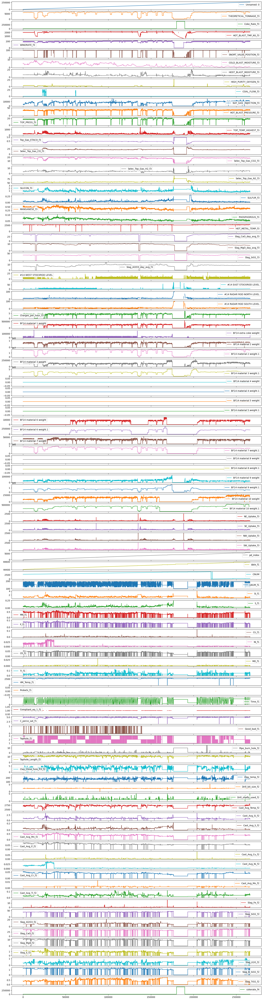

In [10]:

for_RNN_data_CIVS.plot( figsize=(20,80),  subplots=True   )


In [11]:

for_RNN_data_CIVS


,Unnamed: 0,Timestamp_f1,MM_Timestamp_f1,THEORETICAL_TONNAGE_f3,Coke_Rate_f3,HOT_BLAST_TMP_NS_f3,WINDRATE_f3,SNORT_VALVE_POSITION_f3,COLD_BLAST_MOISTURE_f3,HOST_BLAST_MOISTURE_f3,HIGH_PURITY_OXYGEN_f3,COAL_FLOW_f3,NAT_GAS _INJECTION_f3,HOT_BLAST_PRESSURE_f3,TOP_PRESS_f3,TOP_TEMP_HIGHEST_f3,Top_Gas_ETACO_f3,Selec_Top_Gas_CO_f3,Selec_Top_Gas_CO2_f3,Selec_Top_Gas_H2_f3,Selec_Top_Gas_N2_f3,SILICON_f3,SULFUR_f3,MANGANESE_f3,PHOSPHOROUS_f3,HOT_METAL_TEMP_f3,Slag_CaO_day_avg_f3,Slag_MgO_day_avg_f3,Slag_SiO2_f3,Slag_Al2O3_day_avg_f3,#14 WEST STOCKROD LEVEL,#14 EAST STOCKROD LEVEL,#14 RADAR ROD NORTH LEVEL,#14 RADAR ROD SOUTH LEVEL,Charges_per_hour_f3,BF14 material 1 weight,BF14 extra coke weight,BF14 material 2 weight,BF14 material 2 weight.1,BF14 material 3 weight,BF14 material 3 weight.1,BF14 material 4 weight,BF14 material 4 weight.1,BF14 material 5 weight,BF14 material 5 weight.1,BF14 material 6 weight,BF14 material 6 weight.1,BF14 material 7 weight,BF14 material 7 weight.1,BF14 material 8 weight,BF14 material 8 weight.1,BF14 material 9 weight,BF14 material 9 weight.1,BF14 material 10 weight,BF14 material 10 weight.1,NE_Uptake_f3,SE_Uptake_f3,NW_Uptake_f3,SW_Uptake_f3,pd_index,date_f1,CNUM,LNUM_f1,SI_f1,S_f1,MN_f1,P_f1,CU_f1,NI_f1,CR_f1,MO_f1,TI_f1,HM_Temp_f1,ProbeSi_f1,Time_f1,Compliant_eq_1_f1,C_perce_sat_f1,Before_After_f1,Good_bad_f1,date,Slag_Time_f2,Open_Time_f2,Close_Time_f2,Taphole_f2,Pipe_burn_hole_f2,Taphole_Length_f2,Clay_box_f2,Clay_Close_hole_ft3_f2,Clay_temp_f2,Drill_bit_size_f2,Drill_shafts_used_f2,Cast_Avg_Temp_f2,Cast_Avg_Si_f2,Cast_Avg_S_f2,Cast_Avg_Mn_f2,Cast_Avg_P_f2,Cast_Avg_Cu_f2,Cast_Avg_Ni_f2,Cast_Avg_Cr_f2,Cast_Avg_Mo_f2,Cast_Avg_Ti_f2,Slag_Fe_f2,Slag_SiO2_f2,Slag_Al2O3_f2,Slag_CaO_f2,Slag_MgO_f2,Slag_S_f2,Slag_K2O_f2,Slag_B_SiO2_f2,Slag_TiO2_f2,cokerate_f4
0,0,2021-08-01 01:23:00,2021-08-01 00:00:00,6006,992,1999.604384,179.749638,98.334297,4.997585,8.084517,2.510680,0.0,4034.234339,34.357590,17.398326,245.335109,0.458303,22.322068,18.729296,3.559210,54.250139,0.776,0.052,0.510,0.068,2736.960938,37.830002,10.577999,38.029511,7.084000,8.720904,-0.001068,8.455500,8.706066,4.172247,226085.1667,309.166667,653422.0,15730100,103426.0000,2756060,0,0,0,0,0.000000,0,31782.33333,848140,0,0,21118.33333,562140,9022.666667,212980,158.478922,245.634175,145.396538,220.717349,0,44409,2809,182,1.152,0.042,0.577,0.077,0.003,0.020,0.052,0.002,0.036,2677,NaN,0.057639,NaN,4.692156,B,0.0,8/1/2021 0:00,00:59,00:55,03:23,2,0,11.4,602,2.75,165,2.12,1,2714,1.048,0.046,0.546,0.075,0.003,0.018,0.051,0.002,0.032,0.05,38.709999,7.37,37.610001,10.59,1.06,0.38,1.25,0.41,992
1,1,2021-08-01 01:23:00,2021-08-01 00:01:00,6006,992,2000.288837,179.765945,98.334297,5.000531,8.079545,2.489381,0.0,4024.947376,34.328821,17.483486,251.198262,0.458277,22.335329,18.731320,3.559234,54.194257,0.776,0.052,0.510,0.068,2736.960938,37.830002,10.577999,38.029511,7.084000,3.973097,-0.001068,8.617396,8.988543,4.166692,226655.5000,927.500000,651306.0,15730100,103438.0000,2756060,0,0,0,0,0.000000,0,31787.00000,848140,0,0,21115.00000,562140,8988.000000,212980,159.637733,252.459217,145.570895,226.360600,0,44409,2809,182,1.152,0.042,0.577,0.077,0.003,0.020,0.052,0.002,0.036,2677,NaN,0.057639,NaN,4.692156,B,0.0,8/1/2021 0:00,00:59,00:55,03:23,2,0,11.4,602,2.75,165,2.12,1,2714,1.048,0.046,0.546,0.075,0.003,0.018,0.051,0.002,0.032,0.05,38.709999,7.37,37.610001,10.59,1.06,0.38,1.25,0.41,992
2,2,2021-08-01 01:23:00,2021-08-01 00:02:00,6006,992,1999.242862,179.782251,98.334297,5.003476,8.074573,2.489037,0.0,4011.601682,34.300052,17.260358,242.609669,0.458250,22.348590,18.733343,3.559259,54.138374,0.776,0.052,0.510,0.068,2736.960938,37.830002,10.577999,38.029511,7.084000,0.158669,-0.001068,8.654926,9.076585,4.166692,227225.8333,1545.833333,649190.0,15730100,103450.0000,2756060,0,0,0,0,0.000000,0,31791.66667,848140,0,0,21111.66667,562140,8953.333333,212980,160.796544,252.645736,145.745252,230.297540,0,44409,2809,182,1.152,0.042,0.577,0.077,0.003,0.020,0.052,0.002,0.036,2

In [12]:

for_RNN_data_CIVS['MM_Timestamp_f1'][1000:1400]


1000    2021-08-01 16:40:00
1001    2021-08-01 16:41:00
1002    2021-08-01 16:42:00
1003    2021-08-01 16:43:00
1004    2021-08-01 16:44:00
               ...         
1395    2021-08-01 23:15:00
1396    2021-08-01 23:16:00
1397    2021-08-01 23:17:00
1398    2021-08-01 23:18:00
1399    2021-08-01 23:19:00
Name: MM_Timestamp_f1, Length: 400, dtype: object


## Select columns to use in the dataframe 


In [13]:

all_columns_in_DF = for_RNN_data_CIVS.columns.values.tolist()
all_columns_in_DF


['Unnamed: 0',
 'Timestamp_f1',
 'MM_Timestamp_f1',
 'THEORETICAL_TONNAGE_f3',
 'Coke_Rate_f3',
 'HOT_BLAST_TMP_NS_f3',
 'WINDRATE_f3',
 'SNORT_VALVE_POSITION_f3',
 'COLD_BLAST_MOISTURE_f3',
 'HOST_BLAST_MOISTURE_f3',
 'HIGH_PURITY_OXYGEN_f3',
 'COAL_FLOW_f3',
 'NAT_GAS _INJECTION_f3',
 'HOT_BLAST_PRESSURE_f3',
 'TOP_PRESS_f3',
 'TOP_TEMP_HIGHEST_f3',
 'Top_Gas_ETACO_f3 ',
 'Selec_Top_Gas_CO_f3',
 'Selec_Top_Gas_CO2_f3',
 'Selec_Top_Gas_H2_f3',
 'Selec_Top_Gas_N2_f3',
 'SILICON_f3',
 'SULFUR_f3',
 'MANGANESE_f3',
 'PHOSPHOROUS_f3',
 'HOT_METAL_TEMP_f3',
 'Slag_CaO_day_avg_f3',
 'Slag_MgO_day_avg_f3',
 'Slag_SiO2_f3',
 'Slag_Al2O3_day_avg_f3',
 '#14 WEST STOCKROD LEVEL',
 '#14 EAST STOCKROD LEVEL',
 '#14 RADAR ROD NORTH LEVEL',
 '#14 RADAR ROD SOUTH LEVEL',
 'Charges_per_hour_f3',
 'BF14 material 1 weight',
 'BF14 extra coke weight',
 'BF14 material 2 weight',
 'BF14 material 2 weight.1',
 'BF14 material 3 weight',
 'BF14 material 3 weight.1',
 'BF14 material 4 weight',
 'BF14 material 

In [14]:
'''

1. HB Moist (from 265,000 row file) – Hot blast moisture, should have an impact within 1hr

2. Top Gas -> Avg the following [uptakeSW.1, uptakeNE.1, uptakeSE.1, uptakeNW.1] (from 265,000 row file ) 
– Top gas temperatures, should have an impact within 1hr

3. TGC0.1       (from 265,000 row file) – Top gas CO content, should have an impact within 1hr

4. TGC02.1      (from 265,000 row file) – Top gas CO2 content, should have an impact within 1hr

5. TGH2.1       (from 265,000 row file) – Top gas H2 content, should have an impact within 1hr

6. TGN2.1       (from 265,000 row file) – Top gas N2 content, should have an impact within 1hr

7. HB Temp.1 (from 265,000 row file) – Hot blast temperature, should have an impact within 1hr

8. WINDRATE_f3 - Blast furnace wind rate (kSCFM), should have an impact within 1hr

9. HIGH_PURITY_OXYGEN_f3 - Oxygen enrichment, should have an impact within 1hr

10. COAL_FLOW_f3 - Coal injection rate, should have an impact within 1hr

11. NAT_GAS_INJECTION_f3 - Natural gas injection rate, should have an impact within 1hr

12. Coke_Rate (check with USS to determine the hrly charge Coke Rate) - include later - 6hrs impact


Previous cast average values of:

13. Cast_Avg_Si_f2 (timestamp from 6000 row file)

14. Cast_Avg_Mn_f2 (timestamp from 6000 row file)

15. Slag_Fe_f2 (timestamp from 6000 row file)


'''

 

                        
## 'HOT_BLAST_PRESSURE_f3', 'TOP_PRESS_f3', 'TOP_TEMP_HIGHEST_f3', 'SULFUR_f3', 'HOT_METAL_TEMP_f3',
## 'Charges_per_hour_f3', 'HM_Temp_f1', 'Time_f1', 'date', 'Slag_Time_f2', 'Open_Time_f2', 
## 'Close_Time_f2', 'Slag_SiO2_f3',  'Slag_SiO2_f2'


'\n\n1. HB Moist (from 265,000 row file) – Hot blast moisture, should have an impact within 1hr\n\n2. Top Gas -> Avg the following [uptakeSW.1, uptakeNE.1, uptakeSE.1, uptakeNW.1] (from 265,000 row file ) \n– Top gas temperatures, should have an impact within 1hr\n\n3. TGC0.1       (from 265,000 row file) – Top gas CO content, should have an impact within 1hr\n\n4. TGC02.1      (from 265,000 row file) – Top gas CO2 content, should have an impact within 1hr\n\n5. TGH2.1       (from 265,000 row file) – Top gas H2 content, should have an impact within 1hr\n\n6. TGN2.1       (from 265,000 row file) – Top gas N2 content, should have an impact within 1hr\n\n7. HB Temp.1 (from 265,000 row file) – Hot blast temperature, should have an impact within 1hr\n\n8. WINDRATE_f3 - Blast furnace wind rate (kSCFM), should have an impact within 1hr\n\n9. HIGH_PURITY_OXYGEN_f3 - Oxygen enrichment, should have an impact within 1hr\n\n10. COAL_FLOW_f3 - Coal injection rate, should have an impact within 1hr\n

In [15]:

selected_columns_RNN = [ 'SI_f1','Timestamp_f1', 'MM_Timestamp_f1',  'HOST_BLAST_MOISTURE_f3', 'HOT_BLAST_TMP_NS_f3', 
                       'NAT_GAS _INJECTION_f3',  'WINDRATE_f3',  'HIGH_PURITY_OXYGEN_f3', 'COAL_FLOW_f3', 'cokerate_f4', 
                       'Cast_Avg_Mn_f2', 'Slag_Fe_f2',  'date_f1', 'CNUM', 'LNUM_f1',
                       'Selec_Top_Gas_CO_f3',  'Selec_Top_Gas_CO2_f3', 'Selec_Top_Gas_H2_f3', 'Selec_Top_Gas_N2_f3',
                       'NE_Uptake_f3', 'SE_Uptake_f3', 'NW_Uptake_f3', 'SW_Uptake_f3',  
                       'Slag_SiO2_f2', 'Slag_CaO_f2', 'Slag_MgO_f2', 'SNORT_VALVE_POSITION_f3', 'TOP_PRESS_f3', 'HOT_BLAST_PRESSURE_f3'
                       ]


In [16]:

selected_columns_RNN


['SI_f1',
 'Timestamp_f1',
 'MM_Timestamp_f1',
 'HOST_BLAST_MOISTURE_f3',
 'HOT_BLAST_TMP_NS_f3',
 'NAT_GAS _INJECTION_f3',
 'WINDRATE_f3',
 'HIGH_PURITY_OXYGEN_f3',
 'COAL_FLOW_f3',
 'cokerate_f4',
 'Cast_Avg_Mn_f2',
 'Slag_Fe_f2',
 'date_f1',
 'CNUM',
 'LNUM_f1',
 'Selec_Top_Gas_CO_f3',
 'Selec_Top_Gas_CO2_f3',
 'Selec_Top_Gas_H2_f3',
 'Selec_Top_Gas_N2_f3',
 'NE_Uptake_f3',
 'SE_Uptake_f3',
 'NW_Uptake_f3',
 'SW_Uptake_f3',
 'Slag_SiO2_f2',
 'Slag_CaO_f2',
 'Slag_MgO_f2',
 'SNORT_VALVE_POSITION_f3',
 'TOP_PRESS_f3',
 'HOT_BLAST_PRESSURE_f3']

In [17]:

selected_cols_for_RNN_data_CIVS_df = for_RNN_data_CIVS[  selected_columns_RNN  ]


In [18]:

selected_cols_for_RNN_data_CIVS_df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 266216 entries, 0 to 266215
Data columns (total 29 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   SI_f1                    238453 non-null  float64
 1   Timestamp_f1             266216 non-null  object 
 2   MM_Timestamp_f1          266216 non-null  object 
 3   HOST_BLAST_MOISTURE_f3   266141 non-null  float64
 4   HOT_BLAST_TMP_NS_f3      263144 non-null  float64
 5   NAT_GAS _INJECTION_f3    266141 non-null  float64
 6   WINDRATE_f3              266133 non-null  float64
 7   HIGH_PURITY_OXYGEN_f3    266141 non-null  float64
 8   COAL_FLOW_f3             266141 non-null  float64
 9   cokerate_f4              266216 non-null  int64  
 10  Cast_Avg_Mn_f2           266216 non-null  float64
 11  Slag_Fe_f2               266216 non-null  float64
 12  date_f1                  266216 non-null  int64  
 13  CNUM                     266216 non-null  int64  
 14  LNUM

In [19]:

selected_cols_for_RNN_data_CIVS_df 


,SI_f1,Timestamp_f1,MM_Timestamp_f1,HOST_BLAST_MOISTURE_f3,HOT_BLAST_TMP_NS_f3,NAT_GAS _INJECTION_f3,WINDRATE_f3,HIGH_PURITY_OXYGEN_f3,COAL_FLOW_f3,cokerate_f4,Cast_Avg_Mn_f2,Slag_Fe_f2,date_f1,CNUM,LNUM_f1,Selec_Top_Gas_CO_f3,Selec_Top_Gas_CO2_f3,Selec_Top_Gas_H2_f3,Selec_Top_Gas_N2_f3,NE_Uptake_f3,SE_Uptake_f3,NW_Uptake_f3,SW_Uptake_f3,Slag_SiO2_f2,Slag_CaO_f2,Slag_MgO_f2,SNORT_VALVE_POSITION_f3,TOP_PRESS_f3,HOT_BLAST_PRESSURE_f3
0,1.152,2021-08-01 01:23:00,2021-08-01 00:00:00,8.084517,1999.604384,4034.234339,179.749638,2.510680,0.0,992,0.546,0.05,44409,2809,182,22.322068,18.729296,3.559210,54.250139,158.478922,245.634175,145.396538,220.717349,38.709999,37.610001,10.59,98.334297,17.398326,34.357590
1,1.152,2021-08-01 01:23:00,2021-08-01 00:01:00,8.079545,2000.288837,4024.947376,179.765945,2.489381,0.0,992,0.546,0.05,44409,2809,182,22.335329,18.731320,3.559234,54.194257,159.637733,252.459217,145.570895,226.360600,38.709999,37.610001,10.59,98.334297,17.483486,34.328821
2,1.152,2021-08-01 01:23:00,2021-08-01 00:02:00,8.074573,1999.242862,4011.601682,179.782251,2.489037,0.0,992,0.546,0.05,44409,2809,182,22.348590,18.733343,3.559259,54.138374,160.796544,252.645736,145.745252,230.297540,38.709999,37.610001,10.59,98.334297,17.260358,34.300052
3,1.152,2021-08-01 01:23:00,2021-08-01 00:03:00,8.069602,1999.884442,4012.024633,179.798490,2.496867,0.0,992,0.546,0.05,44409,2809,182,22.361852,18.735367,3.559284,54.082797,161.955355,247.987563,145.919609,225.220292,38.709999,37.610001,10.59,98.334297,17.212606,34.271282
4,1.152,2021-08-01 01:23:00,2021-08-01 00:04:00,8.064630,1999.849729,4000.467204,179.784430,2.501961,0.0,992,0.546,0.05,44409,2809,182,22.375113,18.737391,3.559309,54.063779,163.102736,226.923719,146.093966,218.827693,38.709999,37.610001,10.59,98.334297,17.405035,34.242513
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
266211,0.547,2022-01-31 22:16:00,2022-01-31 22:12:00,5.105940,2167.603916,10497.271240,189.029098,0.000000,0.0,924,0.360,0.32,44592,380,138,21.187997,17.110034,4.891530,55.081109,184.027980,272.239649,194.782045,278.493586,39.090000,40.560001,7.86,98.334297,18.695292,35.644868
266212,0.547,2022-01-31 22:16:00,2022-01-31 22:13:00,5.110442,2167.404841,10524.821170,188.892415,0.000000,0.0,924,0.360,0.32,44592,380,138,21.187670,17.108010,4.892282,55.089262,184.021092,267.144444,194.535199,272.149670,39.090000,40.560001,7.86,98.334297,17.985995,35.648894
266213,0.547,2022-01-31 22:16:00,2022-01-31 22:14:00,5.114944,2167.205766,10520.260680,188.689857,0.000000,0.0,924,0.360,0.32,44592,380,138,21.187344,17.105986,4.893035,55.097414,184.014203,264.294662,194.527872,267.771017,39.090000,40.560001,7.86,98.334297,18.707857,35.635697
266214,0.547,2022-01-31 22:16:00,2022-01-31 22:15:00,5.119446,2167.006691,10518.901880,188.610793,0.000000,0.0,924,0.360,0.32,44592,380,138,21.187018,17.103962,4.893787,55.108332,184.007315,265.552978,194.520545,266.423241,39.090000,40.560001,7.86,98.334297,18.198216,35.621174



## Fill in missing values


In [20]:

# to interpolate the missing values  
selected_cols_for_RNN_data_CIVS_df = selected_cols_for_RNN_data_CIVS_df.interpolate(method ='linear', limit_direction ='forward') 


In [21]:

'''

## linear

BEFORE

2, NaN, 6

AFTER

2, 4, 6

'''


'\n\n## linear\n\nBEFORE\n\n2, NaN, 6\n\nAFTER\n\n2, 4, 6\n\n'


## count missing null values


In [22]:

null_count = selected_cols_for_RNN_data_CIVS_df.isnull().sum().sum()
print('Number of null values:', null_count)


Number of null values: 0


In [23]:

sum(map(any, selected_cols_for_RNN_data_CIVS_df.isnull()))


29

In [24]:

df = selected_cols_for_RNN_data_CIVS_df 

# TOTAL number of missing values:
print( df.isna().sum().sum() )


# number of ROWS with at least one missing value:
print( (df.isna().sum(axis=1) > 0).sum() )


# number of COLUMNS with at least one missing value:
print( (df.isna().sum(axis=0) > 0).sum() )



0
0
0


In [25]:

print (df.isna().any(axis=1).sum())


0


In [26]:

# check for NaN values in each column
print(df.isnull().any())


SI_f1                      False
Timestamp_f1               False
MM_Timestamp_f1            False
HOST_BLAST_MOISTURE_f3     False
HOT_BLAST_TMP_NS_f3        False
NAT_GAS _INJECTION_f3      False
WINDRATE_f3                False
HIGH_PURITY_OXYGEN_f3      False
COAL_FLOW_f3               False
cokerate_f4                False
Cast_Avg_Mn_f2             False
Slag_Fe_f2                 False
date_f1                    False
CNUM                       False
LNUM_f1                    False
Selec_Top_Gas_CO_f3        False
Selec_Top_Gas_CO2_f3       False
Selec_Top_Gas_H2_f3        False
Selec_Top_Gas_N2_f3        False
NE_Uptake_f3               False
SE_Uptake_f3               False
NW_Uptake_f3               False
SW_Uptake_f3               False
Slag_SiO2_f2               False
Slag_CaO_f2                False
Slag_MgO_f2                False
SNORT_VALVE_POSITION_f3    False
TOP_PRESS_f3               False
HOT_BLAST_PRESSURE_f3      False
dtype: bool



## Remove rows related to downtime


In [27]:

selected_cols_for_RNN_data_CIVS_df


,SI_f1,Timestamp_f1,MM_Timestamp_f1,HOST_BLAST_MOISTURE_f3,HOT_BLAST_TMP_NS_f3,NAT_GAS _INJECTION_f3,WINDRATE_f3,HIGH_PURITY_OXYGEN_f3,COAL_FLOW_f3,cokerate_f4,Cast_Avg_Mn_f2,Slag_Fe_f2,date_f1,CNUM,LNUM_f1,Selec_Top_Gas_CO_f3,Selec_Top_Gas_CO2_f3,Selec_Top_Gas_H2_f3,Selec_Top_Gas_N2_f3,NE_Uptake_f3,SE_Uptake_f3,NW_Uptake_f3,SW_Uptake_f3,Slag_SiO2_f2,Slag_CaO_f2,Slag_MgO_f2,SNORT_VALVE_POSITION_f3,TOP_PRESS_f3,HOT_BLAST_PRESSURE_f3
0,1.152,2021-08-01 01:23:00,2021-08-01 00:00:00,8.084517,1999.604384,4034.234339,179.749638,2.510680,0.0,992,0.546,0.05,44409,2809,182,22.322068,18.729296,3.559210,54.250139,158.478922,245.634175,145.396538,220.717349,38.709999,37.610001,10.59,98.334297,17.398326,34.357590
1,1.152,2021-08-01 01:23:00,2021-08-01 00:01:00,8.079545,2000.288837,4024.947376,179.765945,2.489381,0.0,992,0.546,0.05,44409,2809,182,22.335329,18.731320,3.559234,54.194257,159.637733,252.459217,145.570895,226.360600,38.709999,37.610001,10.59,98.334297,17.483486,34.328821
2,1.152,2021-08-01 01:23:00,2021-08-01 00:02:00,8.074573,1999.242862,4011.601682,179.782251,2.489037,0.0,992,0.546,0.05,44409,2809,182,22.348590,18.733343,3.559259,54.138374,160.796544,252.645736,145.745252,230.297540,38.709999,37.610001,10.59,98.334297,17.260358,34.300052
3,1.152,2021-08-01 01:23:00,2021-08-01 00:03:00,8.069602,1999.884442,4012.024633,179.798490,2.496867,0.0,992,0.546,0.05,44409,2809,182,22.361852,18.735367,3.559284,54.082797,161.955355,247.987563,145.919609,225.220292,38.709999,37.610001,10.59,98.334297,17.212606,34.271282
4,1.152,2021-08-01 01:23:00,2021-08-01 00:04:00,8.064630,1999.849729,4000.467204,179.784430,2.501961,0.0,992,0.546,0.05,44409,2809,182,22.375113,18.737391,3.559309,54.063779,163.102736,226.923719,146.093966,218.827693,38.709999,37.610001,10.59,98.334297,17.405035,34.242513
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
266211,0.547,2022-01-31 22:16:00,2022-01-31 22:12:00,5.105940,2167.603916,10497.271240,189.029098,0.000000,0.0,924,0.360,0.32,44592,380,138,21.187997,17.110034,4.891530,55.081109,184.027980,272.239649,194.782045,278.493586,39.090000,40.560001,7.86,98.334297,18.695292,35.644868
266212,0.547,2022-01-31 22:16:00,2022-01-31 22:13:00,5.110442,2167.404841,10524.821170,188.892415,0.000000,0.0,924,0.360,0.32,44592,380,138,21.187670,17.108010,4.892282,55.089262,184.021092,267.144444,194.535199,272.149670,39.090000,40.560001,7.86,98.334297,17.985995,35.648894
266213,0.547,2022-01-31 22:16:00,2022-01-31 22:14:00,5.114944,2167.205766,10520.260680,188.689857,0.000000,0.0,924,0.360,0.32,44592,380,138,21.187344,17.105986,4.893035,55.097414,184.014203,264.294662,194.527872,267.771017,39.090000,40.560001,7.86,98.334297,18.707857,35.635697
266214,0.547,2022-01-31 22:16:00,2022-01-31 22:15:00,5.119446,2167.006691,10518.901880,188.610793,0.000000,0.0,924,0.360,0.32,44592,380,138,21.187018,17.103962,4.893787,55.108332,184.007315,265.552978,194.520545,266.423241,39.090000,40.560001,7.86,98.334297,18.198216,35.621174


In [28]:

def remove_downtime(data_frame):
    data_frame = pd.DataFrame(data_frame)
    data_frame = data_frame.replace(np.nan,0)

    
    data_frame = data_frame[data_frame['SNORT_VALVE_POSITION_f3'].apply(lambda x:   not any(c.isalpha() for c in str(x)))]
    data_frame = data_frame[data_frame['TOP_PRESS_f3'].apply(lambda x:              not any(c.isalpha() for c in str(x)))]
    data_frame = data_frame[data_frame['HOT_BLAST_PRESSURE_f3'].apply(lambda x:     not any(c.isalpha() for c in str(x)))]


    #data_frame = data_frame.rename(columns = {'Unnamed: 0': 'timestamp'})
    
    data_frame['SNORT_VALVE_POSITION_f3']   = pd.to_numeric( data_frame['SNORT_VALVE_POSITION_f3'] )
    data_frame['TOP_PRESS_f3']              = pd.to_numeric( data_frame['TOP_PRESS_f3'] )
    data_frame['HOT_BLAST_PRESSURE_f3']     = pd.to_numeric( data_frame['HOT_BLAST_PRESSURE_f3'] )
    data_frame['MM_Timestamp_f1'] = pd.to_datetime( data_frame['MM_Timestamp_f1'] )


    data_frame = data_frame[data_frame['SNORT_VALVE_POSITION_f3'] >= 60]
    data_frame = data_frame[data_frame['TOP_PRESS_f3'] >=4]
    data_frame = data_frame[data_frame['HOT_BLAST_PRESSURE_f3']>=5]


    data = data_frame.copy()
    
    data['timediff'] = data['MM_Timestamp_f1'].diff().dt.total_seconds() / 60.0
    data = data[['MM_Timestamp_f1', 'SNORT_VALVE_POSITION_f3','HOT_BLAST_PRESSURE_f3','TOP_PRESS_f3','timediff']]
    data['idx'] = data.index


    list_f = []
    list_t = []
    data = data.reset_index()

    for i in range(len(data)-1):
        if data['timediff'][i] > 100:
            list_f.append([(data['idx'][i-1]) - 180,(data['idx'][i])+480] )
            list_t.append([(data['MM_Timestamp_f1'][i-1]) - pd.to_timedelta(6, unit='h'),(data['MM_Timestamp_f1'][i])+pd.to_timedelta(24, unit='h')] )
        
    
    for i in list_f:
        result = data_frame[i[0]:(i[1]+1)]
        if result.empty:
            continue
        else:
            data_frame = data_frame.drop(data_frame.index[i[0]:(i[1]+1)])
    

    return data_frame


In [29]:

selected_cols_for_RNN_data_CIVS_df = remove_downtime(  selected_cols_for_RNN_data_CIVS_df  )


In [30]:

selected_cols_for_RNN_data_CIVS_df


,SI_f1,Timestamp_f1,MM_Timestamp_f1,HOST_BLAST_MOISTURE_f3,HOT_BLAST_TMP_NS_f3,NAT_GAS _INJECTION_f3,WINDRATE_f3,HIGH_PURITY_OXYGEN_f3,COAL_FLOW_f3,cokerate_f4,Cast_Avg_Mn_f2,Slag_Fe_f2,date_f1,CNUM,LNUM_f1,Selec_Top_Gas_CO_f3,Selec_Top_Gas_CO2_f3,Selec_Top_Gas_H2_f3,Selec_Top_Gas_N2_f3,NE_Uptake_f3,SE_Uptake_f3,NW_Uptake_f3,SW_Uptake_f3,Slag_SiO2_f2,Slag_CaO_f2,Slag_MgO_f2,SNORT_VALVE_POSITION_f3,TOP_PRESS_f3,HOT_BLAST_PRESSURE_f3
0,1.152,2021-08-01 01:23:00,2021-08-01 00:00:00,8.084517,1999.604384,4034.234339,179.749638,2.510680,0.0,992,0.546,0.05,44409,2809,182,22.322068,18.729296,3.559210,54.250139,158.478922,245.634175,145.396538,220.717349,38.709999,37.610001,10.59,98.334297,17.398326,34.357590
1,1.152,2021-08-01 01:23:00,2021-08-01 00:01:00,8.079545,2000.288837,4024.947376,179.765945,2.489381,0.0,992,0.546,0.05,44409,2809,182,22.335329,18.731320,3.559234,54.194257,159.637733,252.459217,145.570895,226.360600,38.709999,37.610001,10.59,98.334297,17.483486,34.328821
2,1.152,2021-08-01 01:23:00,2021-08-01 00:02:00,8.074573,1999.242862,4011.601682,179.782251,2.489037,0.0,992,0.546,0.05,44409,2809,182,22.348590,18.733343,3.559259,54.138374,160.796544,252.645736,145.745252,230.297540,38.709999,37.610001,10.59,98.334297,17.260358,34.300052
3,1.152,2021-08-01 01:23:00,2021-08-01 00:03:00,8.069602,1999.884442,4012.024633,179.798490,2.496867,0.0,992,0.546,0.05,44409,2809,182,22.361852,18.735367,3.559284,54.082797,161.955355,247.987563,145.919609,225.220292,38.709999,37.610001,10.59,98.334297,17.212606,34.271282
4,1.152,2021-08-01 01:23:00,2021-08-01 00:04:00,8.064630,1999.849729,4000.467204,179.784430,2.501961,0.0,992,0.546,0.05,44409,2809,182,22.375113,18.737391,3.559309,54.063779,163.102736,226.923719,146.093966,218.827693,38.709999,37.610001,10.59,98.334297,17.405035,34.242513
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
266211,0.547,2022-01-31 22:16:00,2022-01-31 22:12:00,5.105940,2167.603916,10497.271240,189.029098,0.000000,0.0,924,0.360,0.32,44592,380,138,21.187997,17.110034,4.891530,55.081109,184.027980,272.239649,194.782045,278.493586,39.090000,40.560001,7.86,98.334297,18.695292,35.644868
266212,0.547,2022-01-31 22:16:00,2022-01-31 22:13:00,5.110442,2167.404841,10524.821170,188.892415,0.000000,0.0,924,0.360,0.32,44592,380,138,21.187670,17.108010,4.892282,55.089262,184.021092,267.144444,194.535199,272.149670,39.090000,40.560001,7.86,98.334297,17.985995,35.648894
266213,0.547,2022-01-31 22:16:00,2022-01-31 22:14:00,5.114944,2167.205766,10520.260680,188.689857,0.000000,0.0,924,0.360,0.32,44592,380,138,21.187344,17.105986,4.893035,55.097414,184.014203,264.294662,194.527872,267.771017,39.090000,40.560001,7.86,98.334297,18.707857,35.635697
266214,0.547,2022-01-31 22:16:00,2022-01-31 22:15:00,5.119446,2167.006691,10518.901880,188.610793,0.000000,0.0,924,0.360,0.32,44592,380,138,21.187018,17.103962,4.893787,55.108332,184.007315,265.552978,194.520545,266.423241,39.090000,40.560001,7.86,98.334297,18.198216,35.621174


array([<Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >], dtype=object)

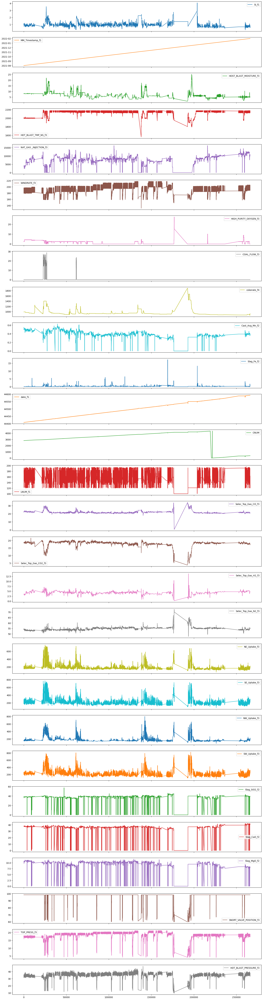

In [31]:

selected_cols_for_RNN_data_CIVS_df.plot( figsize=(20,80),  subplots=True   )



## Reset Index


In [32]:

selected_cols_for_RNN_data_CIVS_df = selected_cols_for_RNN_data_CIVS_df.reset_index()


In [33]:

selected_cols_for_RNN_data_CIVS_df


,index,SI_f1,Timestamp_f1,MM_Timestamp_f1,HOST_BLAST_MOISTURE_f3,HOT_BLAST_TMP_NS_f3,NAT_GAS _INJECTION_f3,WINDRATE_f3,HIGH_PURITY_OXYGEN_f3,COAL_FLOW_f3,cokerate_f4,Cast_Avg_Mn_f2,Slag_Fe_f2,date_f1,CNUM,LNUM_f1,Selec_Top_Gas_CO_f3,Selec_Top_Gas_CO2_f3,Selec_Top_Gas_H2_f3,Selec_Top_Gas_N2_f3,NE_Uptake_f3,SE_Uptake_f3,NW_Uptake_f3,SW_Uptake_f3,Slag_SiO2_f2,Slag_CaO_f2,Slag_MgO_f2,SNORT_VALVE_POSITION_f3,TOP_PRESS_f3,HOT_BLAST_PRESSURE_f3
0,0,1.152,2021-08-01 01:23:00,2021-08-01 00:00:00,8.084517,1999.604384,4034.234339,179.749638,2.510680,0.0,992,0.546,0.05,44409,2809,182,22.322068,18.729296,3.559210,54.250139,158.478922,245.634175,145.396538,220.717349,38.709999,37.610001,10.59,98.334297,17.398326,34.357590
1,1,1.152,2021-08-01 01:23:00,2021-08-01 00:01:00,8.079545,2000.288837,4024.947376,179.765945,2.489381,0.0,992,0.546,0.05,44409,2809,182,22.335329,18.731320,3.559234,54.194257,159.637733,252.459217,145.570895,226.360600,38.709999,37.610001,10.59,98.334297,17.483486,34.328821
2,2,1.152,2021-08-01 01:23:00,2021-08-01 00:02:00,8.074573,1999.242862,4011.601682,179.782251,2.489037,0.0,992,0.546,0.05,44409,2809,182,22.348590,18.733343,3.559259,54.138374,160.796544,252.645736,145.745252,230.297540,38.709999,37.610001,10.59,98.334297,17.260358,34.300052
3,3,1.152,2021-08-01 01:23:00,2021-08-01 00:03:00,8.069602,1999.884442,4012.024633,179.798490,2.496867,0.0,992,0.546,0.05,44409,2809,182,22.361852,18.735367,3.559284,54.082797,161.955355,247.987563,145.919609,225.220292,38.709999,37.610001,10.59,98.334297,17.212606,34.271282
4,4,1.152,2021-08-01 01:23:00,2021-08-01 00:04:00,8.064630,1999.849729,4000.467204,179.784430,2.501961,0.0,992,0.546,0.05,44409,2809,182,22.375113,18.737391,3.559309,54.063779,163.102736,226.923719,146.093966,218.827693,38.709999,37.610001,10.59,98.334297,17.405035,34.242513
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
190132,266211,0.547,2022-01-31 22:16:00,2022-01-31 22:12:00,5.105940,2167.603916,10497.271240,189.029098,0.000000,0.0,924,0.360,0.32,44592,380,138,21.187997,17.110034,4.891530,55.081109,184.027980,272.239649,194.782045,278.493586,39.090000,40.560001,7.86,98.334297,18.695292,35.644868
190133,266212,0.547,2022-01-31 22:16:00,2022-01-31 22:13:00,5.110442,2167.404841,10524.821170,188.892415,0.000000,0.0,924,0.360,0.32,44592,380,138,21.187670,17.108010,4.892282,55.089262,184.021092,267.144444,194.535199,272.149670,39.090000,40.560001,7.86,98.334297,17.985995,35.648894
190134,266213,0.547,2022-01-31 22:16:00,2022-01-31 22:14:00,5.114944,2167.205766,10520.260680,188.689857,0.000000,0.0,924,0.360,0.32,44592,380,138,21.187344,17.105986,4.893035,55.097414,184.014203,264.294662,194.527872,267.771017,39.090000,40.560001,7.86,98.334297,18.707857,35.635697
190135,266214,0.547,2022-01-31 22:16:00,2022-01-31 22:15:00,5.119446,2167.006691,10518.901880,188.610793,0.000000,0.0,924,0.360,0.32,44592,380,138,21.187018,17.103962,4.893787,55.108332,184.007315,265.552978,194.520545,266.423241,39.090000,40.560001,7.86,98.334297,18.198216,35.621174


array([<Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >], dtype=object)

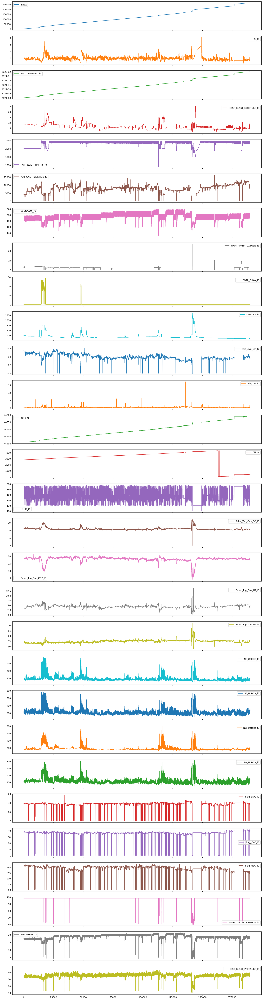

In [34]:

selected_cols_for_RNN_data_CIVS_df.plot( figsize=(20,80),  subplots=True   )


In [35]:

selected_cols_for_RNN_data_CIVS_df


,index,SI_f1,Timestamp_f1,MM_Timestamp_f1,HOST_BLAST_MOISTURE_f3,HOT_BLAST_TMP_NS_f3,NAT_GAS _INJECTION_f3,WINDRATE_f3,HIGH_PURITY_OXYGEN_f3,COAL_FLOW_f3,cokerate_f4,Cast_Avg_Mn_f2,Slag_Fe_f2,date_f1,CNUM,LNUM_f1,Selec_Top_Gas_CO_f3,Selec_Top_Gas_CO2_f3,Selec_Top_Gas_H2_f3,Selec_Top_Gas_N2_f3,NE_Uptake_f3,SE_Uptake_f3,NW_Uptake_f3,SW_Uptake_f3,Slag_SiO2_f2,Slag_CaO_f2,Slag_MgO_f2,SNORT_VALVE_POSITION_f3,TOP_PRESS_f3,HOT_BLAST_PRESSURE_f3
0,0,1.152,2021-08-01 01:23:00,2021-08-01 00:00:00,8.084517,1999.604384,4034.234339,179.749638,2.510680,0.0,992,0.546,0.05,44409,2809,182,22.322068,18.729296,3.559210,54.250139,158.478922,245.634175,145.396538,220.717349,38.709999,37.610001,10.59,98.334297,17.398326,34.357590
1,1,1.152,2021-08-01 01:23:00,2021-08-01 00:01:00,8.079545,2000.288837,4024.947376,179.765945,2.489381,0.0,992,0.546,0.05,44409,2809,182,22.335329,18.731320,3.559234,54.194257,159.637733,252.459217,145.570895,226.360600,38.709999,37.610001,10.59,98.334297,17.483486,34.328821
2,2,1.152,2021-08-01 01:23:00,2021-08-01 00:02:00,8.074573,1999.242862,4011.601682,179.782251,2.489037,0.0,992,0.546,0.05,44409,2809,182,22.348590,18.733343,3.559259,54.138374,160.796544,252.645736,145.745252,230.297540,38.709999,37.610001,10.59,98.334297,17.260358,34.300052
3,3,1.152,2021-08-01 01:23:00,2021-08-01 00:03:00,8.069602,1999.884442,4012.024633,179.798490,2.496867,0.0,992,0.546,0.05,44409,2809,182,22.361852,18.735367,3.559284,54.082797,161.955355,247.987563,145.919609,225.220292,38.709999,37.610001,10.59,98.334297,17.212606,34.271282
4,4,1.152,2021-08-01 01:23:00,2021-08-01 00:04:00,8.064630,1999.849729,4000.467204,179.784430,2.501961,0.0,992,0.546,0.05,44409,2809,182,22.375113,18.737391,3.559309,54.063779,163.102736,226.923719,146.093966,218.827693,38.709999,37.610001,10.59,98.334297,17.405035,34.242513
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
190132,266211,0.547,2022-01-31 22:16:00,2022-01-31 22:12:00,5.105940,2167.603916,10497.271240,189.029098,0.000000,0.0,924,0.360,0.32,44592,380,138,21.187997,17.110034,4.891530,55.081109,184.027980,272.239649,194.782045,278.493586,39.090000,40.560001,7.86,98.334297,18.695292,35.644868
190133,266212,0.547,2022-01-31 22:16:00,2022-01-31 22:13:00,5.110442,2167.404841,10524.821170,188.892415,0.000000,0.0,924,0.360,0.32,44592,380,138,21.187670,17.108010,4.892282,55.089262,184.021092,267.144444,194.535199,272.149670,39.090000,40.560001,7.86,98.334297,17.985995,35.648894
190134,266213,0.547,2022-01-31 22:16:00,2022-01-31 22:14:00,5.114944,2167.205766,10520.260680,188.689857,0.000000,0.0,924,0.360,0.32,44592,380,138,21.187344,17.105986,4.893035,55.097414,184.014203,264.294662,194.527872,267.771017,39.090000,40.560001,7.86,98.334297,18.707857,35.635697
190135,266214,0.547,2022-01-31 22:16:00,2022-01-31 22:15:00,5.119446,2167.006691,10518.901880,188.610793,0.000000,0.0,924,0.360,0.32,44592,380,138,21.187018,17.103962,4.893787,55.108332,184.007315,265.552978,194.520545,266.423241,39.090000,40.560001,7.86,98.334297,18.198216,35.621174


array([[<Axes: title={'center': 'CNUM'}>]], dtype=object)

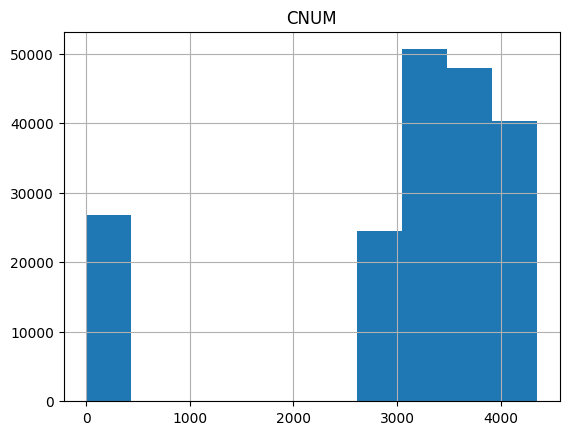

In [36]:

selected_cols_for_RNN_data_CIVS_df.hist(column='CNUM')



## Map CNUMs to cast dates


In [37]:

selected_cols_for_RNN_data_CIVS_df


,index,SI_f1,Timestamp_f1,MM_Timestamp_f1,HOST_BLAST_MOISTURE_f3,HOT_BLAST_TMP_NS_f3,NAT_GAS _INJECTION_f3,WINDRATE_f3,HIGH_PURITY_OXYGEN_f3,COAL_FLOW_f3,cokerate_f4,Cast_Avg_Mn_f2,Slag_Fe_f2,date_f1,CNUM,LNUM_f1,Selec_Top_Gas_CO_f3,Selec_Top_Gas_CO2_f3,Selec_Top_Gas_H2_f3,Selec_Top_Gas_N2_f3,NE_Uptake_f3,SE_Uptake_f3,NW_Uptake_f3,SW_Uptake_f3,Slag_SiO2_f2,Slag_CaO_f2,Slag_MgO_f2,SNORT_VALVE_POSITION_f3,TOP_PRESS_f3,HOT_BLAST_PRESSURE_f3
0,0,1.152,2021-08-01 01:23:00,2021-08-01 00:00:00,8.084517,1999.604384,4034.234339,179.749638,2.510680,0.0,992,0.546,0.05,44409,2809,182,22.322068,18.729296,3.559210,54.250139,158.478922,245.634175,145.396538,220.717349,38.709999,37.610001,10.59,98.334297,17.398326,34.357590
1,1,1.152,2021-08-01 01:23:00,2021-08-01 00:01:00,8.079545,2000.288837,4024.947376,179.765945,2.489381,0.0,992,0.546,0.05,44409,2809,182,22.335329,18.731320,3.559234,54.194257,159.637733,252.459217,145.570895,226.360600,38.709999,37.610001,10.59,98.334297,17.483486,34.328821
2,2,1.152,2021-08-01 01:23:00,2021-08-01 00:02:00,8.074573,1999.242862,4011.601682,179.782251,2.489037,0.0,992,0.546,0.05,44409,2809,182,22.348590,18.733343,3.559259,54.138374,160.796544,252.645736,145.745252,230.297540,38.709999,37.610001,10.59,98.334297,17.260358,34.300052
3,3,1.152,2021-08-01 01:23:00,2021-08-01 00:03:00,8.069602,1999.884442,4012.024633,179.798490,2.496867,0.0,992,0.546,0.05,44409,2809,182,22.361852,18.735367,3.559284,54.082797,161.955355,247.987563,145.919609,225.220292,38.709999,37.610001,10.59,98.334297,17.212606,34.271282
4,4,1.152,2021-08-01 01:23:00,2021-08-01 00:04:00,8.064630,1999.849729,4000.467204,179.784430,2.501961,0.0,992,0.546,0.05,44409,2809,182,22.375113,18.737391,3.559309,54.063779,163.102736,226.923719,146.093966,218.827693,38.709999,37.610001,10.59,98.334297,17.405035,34.242513
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
190132,266211,0.547,2022-01-31 22:16:00,2022-01-31 22:12:00,5.105940,2167.603916,10497.271240,189.029098,0.000000,0.0,924,0.360,0.32,44592,380,138,21.187997,17.110034,4.891530,55.081109,184.027980,272.239649,194.782045,278.493586,39.090000,40.560001,7.86,98.334297,18.695292,35.644868
190133,266212,0.547,2022-01-31 22:16:00,2022-01-31 22:13:00,5.110442,2167.404841,10524.821170,188.892415,0.000000,0.0,924,0.360,0.32,44592,380,138,21.187670,17.108010,4.892282,55.089262,184.021092,267.144444,194.535199,272.149670,39.090000,40.560001,7.86,98.334297,17.985995,35.648894
190134,266213,0.547,2022-01-31 22:16:00,2022-01-31 22:14:00,5.114944,2167.205766,10520.260680,188.689857,0.000000,0.0,924,0.360,0.32,44592,380,138,21.187344,17.105986,4.893035,55.097414,184.014203,264.294662,194.527872,267.771017,39.090000,40.560001,7.86,98.334297,18.707857,35.635697
190135,266214,0.547,2022-01-31 22:16:00,2022-01-31 22:15:00,5.119446,2167.006691,10518.901880,188.610793,0.000000,0.0,924,0.360,0.32,44592,380,138,21.187018,17.103962,4.893787,55.108332,184.007315,265.552978,194.520545,266.423241,39.090000,40.560001,7.86,98.334297,18.198216,35.621174


In [38]:

dict_map_cnum_dates = {}
 
cnum_old = 0

for index, row in selected_cols_for_RNN_data_CIVS_df.iterrows():
    cnum_new = selected_cols_for_RNN_data_CIVS_df.at[index, 'CNUM']
    if cnum_new != cnum_old:
        dict_map_cnum_dates[ cnum_new ] = selected_cols_for_RNN_data_CIVS_df.at[index, 'Timestamp_f1']
        cnum_old                        = cnum_new


In [39]:

dict_map_cnum_dates


{2809: '2021-08-01 01:23:00',
 2810: '2021-08-01 03:30:00',
 2811: '2021-08-01 06:39:00',
 2812: '2021-08-01 08:50:00',
 2813: '2021-08-01 11:38:00',
 2814: '2021-08-01 13:48:00',
 2815: '2021-08-01 16:55:00',
 2816: '2021-08-01 18:50:00',
 2817: '2021-08-01 21:56:00',
 2818: '2021-08-01 00:38:00',
 2819: '2021-08-02 02:18:00',
 2820: '2021-08-02 04:41:00',
 2821: '2021-08-02 06:45:00',
 2823: '2021-08-02 08:56:00',
 2824: '2021-08-02 10:42:00',
 2825: '2021-08-02 13:30:00',
 2826: '2021-08-02 14:30:00',
 2827: '2021-08-02 15:58:00',
 2828: '2021-08-02 18:25:00',
 2829: '2021-08-02 20:33:00',
 2830: '2021-08-02 00:08:00',
 2831: '2021-08-03 01:54:00',
 2832: '2021-08-03 04:11:00',
 2833: '2021-08-03 06:57:00',
 2834: '2021-08-03 09:15:00',
 2835: '2021-08-03 10:15:00',
 2836: '2021-08-03 13:15:00',
 2837: '2021-08-03 14:15:00',
 2838: '2021-08-03 16:50:00',
 2839: '2021-08-03 05:57:00',
 2840: '2021-08-03 19:26:00',
 2841: '2021-08-03 20:11:00',
 2842: '2021-08-03 21:51:00',
 2843: '20

In [40]:

print(len(dict_map_cnum_dates))


1600



## Average by CNUM


In [41]:

## res = MinByMin_137MB_data_CIVS.groupby('Timestamp_f1')[  l_mod  ].mean()

selected_cols_for_RNN_data_CIVS_df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 190137 entries, 0 to 190136
Data columns (total 30 columns):
 #   Column                   Non-Null Count   Dtype         
---  ------                   --------------   -----         
 0   index                    190137 non-null  int64         
 1   SI_f1                    190137 non-null  float64       
 2   Timestamp_f1             190137 non-null  object        
 3   MM_Timestamp_f1          190137 non-null  datetime64[ns]
 4   HOST_BLAST_MOISTURE_f3   190137 non-null  float64       
 5   HOT_BLAST_TMP_NS_f3      190137 non-null  float64       
 6   NAT_GAS _INJECTION_f3    190137 non-null  float64       
 7   WINDRATE_f3              190137 non-null  float64       
 8   HIGH_PURITY_OXYGEN_f3    190137 non-null  float64       
 9   COAL_FLOW_f3             190137 non-null  float64       
 10  cokerate_f4              190137 non-null  int64         
 11  Cast_Avg_Mn_f2           190137 non-null  float64       
 12  Slag_Fe_f2      

In [42]:

selected_columns_RNN_no_dates = [ 'SI_f1', 'HOST_BLAST_MOISTURE_f3', 'HOT_BLAST_TMP_NS_f3', 
                       'NAT_GAS _INJECTION_f3',  'WINDRATE_f3',  'HIGH_PURITY_OXYGEN_f3', 'COAL_FLOW_f3', 'cokerate_f4', 
                       'Cast_Avg_Mn_f2', 'Slag_Fe_f2',  'date_f1', 'CNUM', 'LNUM_f1',
                       'Selec_Top_Gas_CO_f3',  'Selec_Top_Gas_CO2_f3', 'Selec_Top_Gas_H2_f3', 'Selec_Top_Gas_N2_f3',
                       'NE_Uptake_f3', 'SE_Uptake_f3', 'NW_Uptake_f3', 'SW_Uptake_f3',  
                       'Slag_SiO2_f2', 'Slag_CaO_f2', 'Slag_MgO_f2', 'SNORT_VALVE_POSITION_f3', 'TOP_PRESS_f3', 'HOT_BLAST_PRESSURE_f3'
                       ]


In [43]:

res = selected_cols_for_RNN_data_CIVS_df.groupby('CNUM')[  selected_columns_RNN_no_dates   ].mean()


In [44]:

res


,SI_f1,HOST_BLAST_MOISTURE_f3,HOT_BLAST_TMP_NS_f3,NAT_GAS _INJECTION_f3,WINDRATE_f3,HIGH_PURITY_OXYGEN_f3,COAL_FLOW_f3,cokerate_f4,Cast_Avg_Mn_f2,Slag_Fe_f2,date_f1,CNUM,LNUM_f1,Selec_Top_Gas_CO_f3,Selec_Top_Gas_CO2_f3,Selec_Top_Gas_H2_f3,Selec_Top_Gas_N2_f3,NE_Uptake_f3,SE_Uptake_f3,NW_Uptake_f3,SW_Uptake_f3,Slag_SiO2_f2,Slag_CaO_f2,Slag_MgO_f2,SNORT_VALVE_POSITION_f3,TOP_PRESS_f3,HOT_BLAST_PRESSURE_f3
CNUM,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,0.612000,4.238330,2164.265436,9297.367071,184.782388,0.0,0.0,884.0,0.268,0.21,44562.000000,1.0,148.000000,21.076015,18.312771,4.131039,54.929399,172.754360,185.794067,148.124001,198.489715,37.630001,36.450001,9.56,98.334297,18.163729,36.647061
2,0.727000,4.242439,2161.425209,9306.840913,184.818611,0.0,0.0,884.0,0.354,0.16,44562.000000,2.0,168.666667,21.080431,18.313322,4.131228,54.940123,171.769513,182.533770,148.126483,192.512412,37.369999,36.439999,9.86,98.334297,18.532928,36.602600
3,0.655900,4.250658,2155.622815,9317.204202,185.000295,0.0,0.0,884.0,0.323,0.00,44562.000000,3.0,140.400000,21.089264,18.314424,4.131604,54.913984,183.565890,208.733399,148.131446,221.646579,0.000000,0.000000,0.00,98.334297,18.275620,36.601051
4,0.608500,4.257849,2150.390785,9379.027265,184.611966,0.0,0.0,884.0,0.330,0.00,44562.000000,4.0,184.000000,21.096992,18.315388,4.131934,54.888695,187.130836,208.023577,148.135788,207.505852,0.000000,0.000000,0.00,98.334297,18.134174,36.599696
5,0.575508,4.133909,2167.094817,9442.367486,185.744793,0.0,0.0,884.0,0.345,0.00,44561.682047,5.0,140.270134,20.670933,18.674410,4.087428,55.234706,170.263606,204.938759,151.867413,201.510393,0.000000,0.000000,0.00,98.334297,18.378320,36.262273
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4346,0.646000,4.212648,2168.797556,9303.753420,185.007919,0.0,0.0,884.0,0.325,0.16,44561.000000,4346.0,174.000000,21.048415,18.309327,4.129862,55.140373,166.903493,181.684648,148.108493,194.328694,35.580002,36.500000,9.30,98.334297,18.510120,36.877184
4347,0.654667,4.217784,2168.444999,9333.448101,184.942435,0.0,0.0,884.0,0.335,0.26,44561.000000,4347.0,160.000000,21.053935,18.310016,4.130097,55.098014,175.524144,195.202191,148.111595,215.606202,35.130001,37.470001,10.01,98.334297,18.168884,36.681149
4348,0.591667,4.223948,2167.967389,9321.819731,184.863855,0.0,0.0,884.0,0.328,1.08,44561.000000,4348.0,149.333333,21.060559,18.310842,4.130380,55.003376,189.407795,220.149599,148.115317,250.937261,35.570000,36.970001,9.47,98.334297,18.294087,36.723192


array([<Axes: xlabel='CNUM'>, <Axes: xlabel='CNUM'>,
       <Axes: xlabel='CNUM'>, <Axes: xlabel='CNUM'>,
       <Axes: xlabel='CNUM'>, <Axes: xlabel='CNUM'>,
       <Axes: xlabel='CNUM'>, <Axes: xlabel='CNUM'>,
       <Axes: xlabel='CNUM'>, <Axes: xlabel='CNUM'>,
       <Axes: xlabel='CNUM'>, <Axes: xlabel='CNUM'>,
       <Axes: xlabel='CNUM'>, <Axes: xlabel='CNUM'>,
       <Axes: xlabel='CNUM'>, <Axes: xlabel='CNUM'>,
       <Axes: xlabel='CNUM'>, <Axes: xlabel='CNUM'>,
       <Axes: xlabel='CNUM'>, <Axes: xlabel='CNUM'>,
       <Axes: xlabel='CNUM'>, <Axes: xlabel='CNUM'>,
       <Axes: xlabel='CNUM'>, <Axes: xlabel='CNUM'>,
       <Axes: xlabel='CNUM'>, <Axes: xlabel='CNUM'>,
       <Axes: xlabel='CNUM'>], dtype=object)

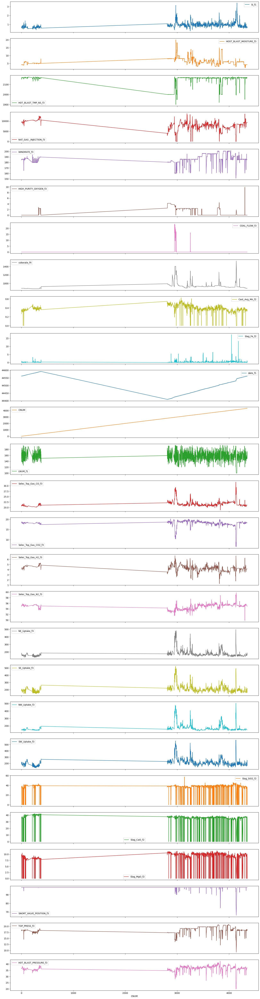

In [45]:

res.plot( figsize=(20,80),  subplots=True   )


In [46]:

res = res.reset_index(drop=True)


array([<Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >], dtype=object)

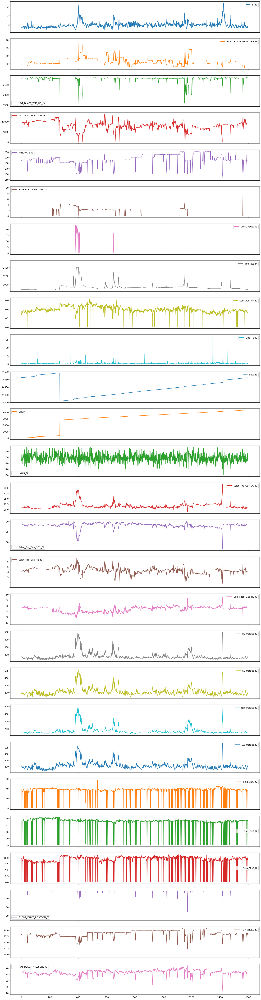

In [47]:

res.plot( figsize=(20,80),  subplots=True   )


In [48]:

res


,SI_f1,HOST_BLAST_MOISTURE_f3,HOT_BLAST_TMP_NS_f3,NAT_GAS _INJECTION_f3,WINDRATE_f3,HIGH_PURITY_OXYGEN_f3,COAL_FLOW_f3,cokerate_f4,Cast_Avg_Mn_f2,Slag_Fe_f2,date_f1,CNUM,LNUM_f1,Selec_Top_Gas_CO_f3,Selec_Top_Gas_CO2_f3,Selec_Top_Gas_H2_f3,Selec_Top_Gas_N2_f3,NE_Uptake_f3,SE_Uptake_f3,NW_Uptake_f3,SW_Uptake_f3,Slag_SiO2_f2,Slag_CaO_f2,Slag_MgO_f2,SNORT_VALVE_POSITION_f3,TOP_PRESS_f3,HOT_BLAST_PRESSURE_f3
0,0.612000,4.238330,2164.265436,9297.367071,184.782388,0.0,0.0,884.0,0.268,0.21,44562.000000,1.0,148.000000,21.076015,18.312771,4.131039,54.929399,172.754360,185.794067,148.124001,198.489715,37.630001,36.450001,9.56,98.334297,18.163729,36.647061
1,0.727000,4.242439,2161.425209,9306.840913,184.818611,0.0,0.0,884.0,0.354,0.16,44562.000000,2.0,168.666667,21.080431,18.313322,4.131228,54.940123,171.769513,182.533770,148.126483,192.512412,37.369999,36.439999,9.86,98.334297,18.532928,36.602600
2,0.655900,4.250658,2155.622815,9317.204202,185.000295,0.0,0.0,884.0,0.323,0.00,44562.000000,3.0,140.400000,21.089264,18.314424,4.131604,54.913984,183.565890,208.733399,148.131446,221.646579,0.000000,0.000000,0.00,98.334297,18.275620,36.601051
3,0.608500,4.257849,2150.390785,9379.027265,184.611966,0.0,0.0,884.0,0.330,0.00,44562.000000,4.0,184.000000,21.096992,18.315388,4.131934,54.888695,187.130836,208.023577,148.135788,207.505852,0.000000,0.000000,0.00,98.334297,18.134174,36.599696
4,0.575508,4.133909,2167.094817,9442.367486,185.744793,0.0,0.0,884.0,0.345,0.00,44561.682047,5.0,140.270134,20.670933,18.674410,4.087428,55.234706,170.263606,204.938759,151.867413,201.510393,0.000000,0.000000,0.00,98.334297,18.378320,36.262273
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1595,0.646000,4.212648,2168.797556,9303.753420,185.007919,0.0,0.0,884.0,0.325,0.16,44561.000000,4346.0,174.000000,21.048415,18.309327,4.129862,55.140373,166.903493,181.684648,148.108493,194.328694,35.580002,36.500000,9.30,98.334297,18.510120,36.877184
1596,0.654667,4.217784,2168.444999,9333.448101,184.942435,0.0,0.0,884.0,0.335,0.26,44561.000000,4347.0,160.000000,21.053935,18.310016,4.130097,55.098014,175.524144,195.202191,148.111595,215.606202,35.130001,37.470001,10.01,98.334297,18.168884,36.681149
1597,0.591667,4.223948,2167.967389,9321.819731,184.863855,0.0,0.0,884.0,0.328,1.08,44561.000000,4348.0,149.333333,21.060559,18.310842,4.130380,55.003376,189.407795,220.149599,148.115317,250.937261,35.570000,36.970001,9.47,98.334297,18.294087,36.723192
1598,0.724667,4.230112,2166.628469,9293.853451,184.785275,0.0,0.0,884.0,0.342,0.19,44561.000000,4349.0,163.666667,21.067183,18.311669,4.130662,54.933862,172.779033,181.521566,148.119039,184.739374,36.180000,35.810001,9.22,98.334297,18.411525,36.900695



## Remove Peaks


In [49]:

res = res[ res['Slag_CaO_f2'] >= 25]


In [50]:


res = res[ res['Cast_Avg_Mn_f2'] >= 0.2 ]


In [51]:


res = res[ res['Slag_Fe_f2'] < 1.5 ]


In [52]:

res = res[ res['COAL_FLOW_f3'] < 2 ]



In [53]:


res = res[ res['Selec_Top_Gas_CO2_f3'] > 15 ]


In [54]:

res = res[ res['HOT_BLAST_PRESSURE_f3'] > 25 ]


In [55]:

res = res[ res['TOP_PRESS_f3'] > 14 ]


In [56]:

res = res.reset_index(drop=True)


In [57]:

res


,SI_f1,HOST_BLAST_MOISTURE_f3,HOT_BLAST_TMP_NS_f3,NAT_GAS _INJECTION_f3,WINDRATE_f3,HIGH_PURITY_OXYGEN_f3,COAL_FLOW_f3,cokerate_f4,Cast_Avg_Mn_f2,Slag_Fe_f2,date_f1,CNUM,LNUM_f1,Selec_Top_Gas_CO_f3,Selec_Top_Gas_CO2_f3,Selec_Top_Gas_H2_f3,Selec_Top_Gas_N2_f3,NE_Uptake_f3,SE_Uptake_f3,NW_Uptake_f3,SW_Uptake_f3,Slag_SiO2_f2,Slag_CaO_f2,Slag_MgO_f2,SNORT_VALVE_POSITION_f3,TOP_PRESS_f3,HOT_BLAST_PRESSURE_f3
0,0.612000,4.238330,2164.265436,9297.367071,184.782388,0.0,0.0,884.0,0.268,0.21,44562.0,1.0,148.000000,21.076015,18.312771,4.131039,54.929399,172.754360,185.794067,148.124001,198.489715,37.630001,36.450001,9.56,98.334297,18.163729,36.647061
1,0.727000,4.242439,2161.425209,9306.840913,184.818611,0.0,0.0,884.0,0.354,0.16,44562.0,2.0,168.666667,21.080431,18.313322,4.131228,54.940123,171.769513,182.533770,148.126483,192.512412,37.369999,36.439999,9.86,98.334297,18.532928,36.602600
2,0.719500,4.174343,2168.238915,9336.364456,185.993447,0.0,0.0,884.0,0.313,0.83,44562.0,6.0,137.450000,20.996415,18.311768,4.133911,55.072779,170.595469,183.725050,148.161842,192.366046,35.540001,35.970001,9.03,98.334297,18.397217,36.882963
3,0.710486,4.126144,2167.779119,9419.200115,185.828474,0.0,0.0,884.0,0.360,0.10,44562.0,7.0,156.684211,20.749627,18.341701,4.137632,55.375043,167.017421,195.812061,147.562523,198.423474,34.849998,36.590000,9.13,98.334297,18.393974,36.568884
4,0.666106,4.120736,2166.974740,9564.165802,185.924481,0.0,0.0,884.0,0.319,0.34,44562.0,8.0,150.869919,20.609259,18.644476,4.142824,55.341884,154.214917,188.028883,147.807509,179.116839,34.009998,35.900002,8.82,98.334297,18.370316,36.839147
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1380,0.762500,4.208539,2169.079601,9312.779010,185.053796,0.0,0.0,884.0,0.324,0.30,44561.0,4345.0,147.500000,21.043999,18.308776,4.129674,55.162767,164.706552,182.408576,148.106012,193.501805,35.900002,37.259998,10.04,98.334297,18.762846,36.949964
1381,0.646000,4.212648,2168.797556,9303.753420,185.007919,0.0,0.0,884.0,0.325,0.16,44561.0,4346.0,174.000000,21.048415,18.309327,4.129862,55.140373,166.903493,181.684648,148.108493,194.328694,35.580002,36.500000,9.30,98.334297,18.510120,36.877184
1382,0.654667,4.217784,2168.444999,9333.448101,184.942435,0.0,0.0,884.0,0.335,0.26,44561.0,4347.0,160.000000,21.053935,18.310016,4.130097,55.098014,175.524144,195.202191,148.111595,215.606202,35.130001,37.470001,10.01,98.334297,18.168884,36.681149
1383,0.591667,4.223948,2167.967389,9321.819731,184.863855,0.0,0.0,884.0,0.328,1.08,44561.0,4348.0,149.333333,21.060559,18.310842,4.130380,55.003376,189.407795,220.149599,148.115317,250.937261,35.570000,36.970001,9.47,98.334297,18.294087,36.723192


array([<Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >], dtype=object)

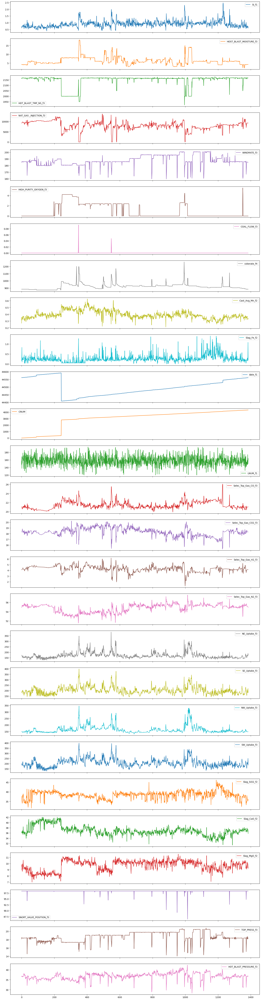

In [58]:

res.plot( figsize=(20,80),  subplots=True   )



## Correlation Matrix


In [59]:

headers_list = res.columns.values.tolist()
headers_list


['SI_f1',
 'HOST_BLAST_MOISTURE_f3',
 'HOT_BLAST_TMP_NS_f3',
 'NAT_GAS _INJECTION_f3',
 'WINDRATE_f3',
 'HIGH_PURITY_OXYGEN_f3',
 'COAL_FLOW_f3',
 'cokerate_f4',
 'Cast_Avg_Mn_f2',
 'Slag_Fe_f2',
 'date_f1',
 'CNUM',
 'LNUM_f1',
 'Selec_Top_Gas_CO_f3',
 'Selec_Top_Gas_CO2_f3',
 'Selec_Top_Gas_H2_f3',
 'Selec_Top_Gas_N2_f3',
 'NE_Uptake_f3',
 'SE_Uptake_f3',
 'NW_Uptake_f3',
 'SW_Uptake_f3',
 'Slag_SiO2_f2',
 'Slag_CaO_f2',
 'Slag_MgO_f2',
 'SNORT_VALVE_POSITION_f3',
 'TOP_PRESS_f3',
 'HOT_BLAST_PRESSURE_f3']

In [60]:

cm = np.corrcoef(  res[ headers_list ].values.T  )


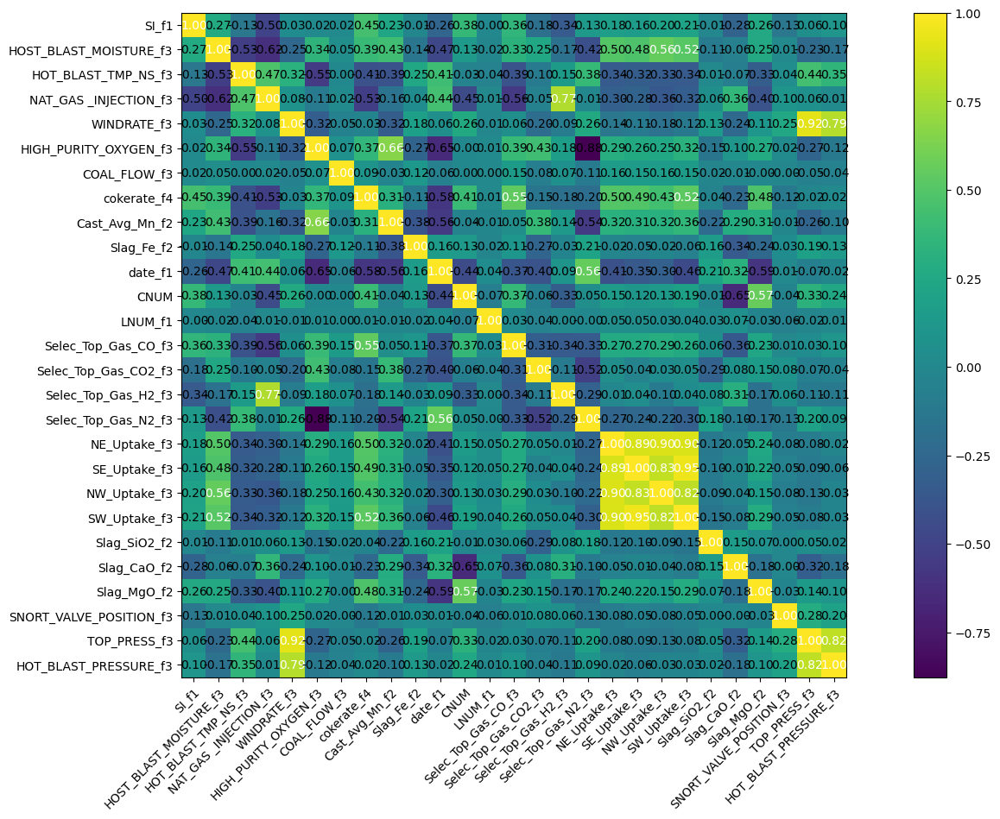

In [61]:

hm = heatmap(cm, row_names= headers_list, column_names=headers_list, figsize=[20,10])
plt.show()



## Most features are one row behind the SI row


In [62]:

cols_rotation_DF = res.columns.values.tolist()
cols_rotation_DF


['SI_f1',
 'HOST_BLAST_MOISTURE_f3',
 'HOT_BLAST_TMP_NS_f3',
 'NAT_GAS _INJECTION_f3',
 'WINDRATE_f3',
 'HIGH_PURITY_OXYGEN_f3',
 'COAL_FLOW_f3',
 'cokerate_f4',
 'Cast_Avg_Mn_f2',
 'Slag_Fe_f2',
 'date_f1',
 'CNUM',
 'LNUM_f1',
 'Selec_Top_Gas_CO_f3',
 'Selec_Top_Gas_CO2_f3',
 'Selec_Top_Gas_H2_f3',
 'Selec_Top_Gas_N2_f3',
 'NE_Uptake_f3',
 'SE_Uptake_f3',
 'NW_Uptake_f3',
 'SW_Uptake_f3',
 'Slag_SiO2_f2',
 'Slag_CaO_f2',
 'Slag_MgO_f2',
 'SNORT_VALVE_POSITION_f3',
 'TOP_PRESS_f3',
 'HOT_BLAST_PRESSURE_f3']

In [63]:

idx = res.index[ : -1]
print(idx)


RangeIndex(start=0, stop=1384, step=1)


In [64]:

y_1_cast = res.iloc[ 1: , 0 ].values
y_1_cast.shape


(1384,)

In [65]:

y_1_cast


array([0.727     , 0.7195    , 0.71048566, ..., 0.65466668, 0.59166666,
       0.72466666])

In [66]:

x_1_cast = res.iloc[ :-1 , 1: ].values
x_1_cast.shape


(1384, 26)

In [67]:

cols_rotation_DF[0]


'SI_f1'

In [68]:

cols_rotation_DF[1:]


['HOST_BLAST_MOISTURE_f3',
 'HOT_BLAST_TMP_NS_f3',
 'NAT_GAS _INJECTION_f3',
 'WINDRATE_f3',
 'HIGH_PURITY_OXYGEN_f3',
 'COAL_FLOW_f3',
 'cokerate_f4',
 'Cast_Avg_Mn_f2',
 'Slag_Fe_f2',
 'date_f1',
 'CNUM',
 'LNUM_f1',
 'Selec_Top_Gas_CO_f3',
 'Selec_Top_Gas_CO2_f3',
 'Selec_Top_Gas_H2_f3',
 'Selec_Top_Gas_N2_f3',
 'NE_Uptake_f3',
 'SE_Uptake_f3',
 'NW_Uptake_f3',
 'SW_Uptake_f3',
 'Slag_SiO2_f2',
 'Slag_CaO_f2',
 'Slag_MgO_f2',
 'SNORT_VALVE_POSITION_f3',
 'TOP_PRESS_f3',
 'HOT_BLAST_PRESSURE_f3']

In [69]:

df_xs = pd.DataFrame(x_1_cast , columns=cols_rotation_DF[1:],      index=idx)
df_y  = pd.DataFrame(y_1_cast , columns=[ cols_rotation_DF[0] ],   index=idx)


In [70]:

print(df_y.shape)
print(df_xs.shape)


(1384, 1)
(1384, 26)


In [71]:

df_res = pd.concat( [ df_y, df_xs], axis=1 )     
print(df_res.shape)


(1384, 27)


In [72]:

df_res


,SI_f1,HOST_BLAST_MOISTURE_f3,HOT_BLAST_TMP_NS_f3,NAT_GAS _INJECTION_f3,WINDRATE_f3,HIGH_PURITY_OXYGEN_f3,COAL_FLOW_f3,cokerate_f4,Cast_Avg_Mn_f2,Slag_Fe_f2,date_f1,CNUM,LNUM_f1,Selec_Top_Gas_CO_f3,Selec_Top_Gas_CO2_f3,Selec_Top_Gas_H2_f3,Selec_Top_Gas_N2_f3,NE_Uptake_f3,SE_Uptake_f3,NW_Uptake_f3,SW_Uptake_f3,Slag_SiO2_f2,Slag_CaO_f2,Slag_MgO_f2,SNORT_VALVE_POSITION_f3,TOP_PRESS_f3,HOT_BLAST_PRESSURE_f3
0,0.727000,4.238330,2164.265436,9297.367071,184.782388,0.0,0.0,884.0,0.268,0.21,44562.0,1.0,148.000000,21.076015,18.312771,4.131039,54.929399,172.754360,185.794067,148.124001,198.489715,37.630001,36.450001,9.56,98.334297,18.163729,36.647061
1,0.719500,4.242439,2161.425209,9306.840913,184.818611,0.0,0.0,884.0,0.354,0.16,44562.0,2.0,168.666667,21.080431,18.313322,4.131228,54.940123,171.769513,182.533770,148.126483,192.512412,37.369999,36.439999,9.86,98.334297,18.532928,36.602600
2,0.710486,4.174343,2168.238915,9336.364456,185.993447,0.0,0.0,884.0,0.313,0.83,44562.0,6.0,137.450000,20.996415,18.311768,4.133911,55.072779,170.595469,183.725050,148.161842,192.366046,35.540001,35.970001,9.03,98.334297,18.397217,36.882963
3,0.666106,4.126144,2167.779119,9419.200115,185.828474,0.0,0.0,884.0,0.360,0.10,44562.0,7.0,156.684211,20.749627,18.341701,4.137632,55.375043,167.017421,195.812061,147.562523,198.423474,34.849998,36.590000,9.13,98.334297,18.393974,36.568884
4,0.675145,4.120736,2166.974740,9564.165802,185.924481,0.0,0.0,884.0,0.319,0.34,44562.0,8.0,150.869919,20.609259,18.644476,4.142824,55.341884,154.214917,188.028883,147.807509,179.116839,34.009998,35.900002,8.82,98.334297,18.370316,36.839147
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1379,0.762500,4.204430,2169.361647,9297.484543,185.046491,0.0,0.0,884.0,0.343,0.30,44561.0,4344.0,147.500000,21.039583,18.308225,4.129485,55.162782,167.619915,185.900341,148.103530,199.914193,35.900002,37.259998,10.04,98.334297,18.209401,36.727897
1380,0.646000,4.208539,2169.079601,9312.779010,185.053796,0.0,0.0,884.0,0.324,0.30,44561.0,4345.0,147.500000,21.043999,18.308776,4.129674,55.162767,164.706552,182.408576,148.106012,193.501805,35.900002,37.259998,10.04,98.334297,18.762846,36.949964
1381,0.654667,4.212648,2168.797556,9303.753420,185.007919,0.0,0.0,884.0,0.325,0.16,44561.0,4346.0,174.000000,21.048415,18.309327,4.129862,55.140373,166.903493,181.684648,148.108493,194.328694,35.580002,36.500000,9.30,98.334297,18.510120,36.877184
1382,0.591667,4.217784,2168.444999,9333.448101,184.942435,0.0,0.0,884.0,0.335,0.26,44561.0,4347.0,160.000000,21.053935,18.310016,4.130097,55.098014,175.524144,195.202191,148.111595,215.606202,35.130001,37.470001,10.01,98.334297,18.168884,36.681149



## Correlation Matrix


In [73]:

headers_list = df_res.columns.values.tolist()
headers_list


['SI_f1',
 'HOST_BLAST_MOISTURE_f3',
 'HOT_BLAST_TMP_NS_f3',
 'NAT_GAS _INJECTION_f3',
 'WINDRATE_f3',
 'HIGH_PURITY_OXYGEN_f3',
 'COAL_FLOW_f3',
 'cokerate_f4',
 'Cast_Avg_Mn_f2',
 'Slag_Fe_f2',
 'date_f1',
 'CNUM',
 'LNUM_f1',
 'Selec_Top_Gas_CO_f3',
 'Selec_Top_Gas_CO2_f3',
 'Selec_Top_Gas_H2_f3',
 'Selec_Top_Gas_N2_f3',
 'NE_Uptake_f3',
 'SE_Uptake_f3',
 'NW_Uptake_f3',
 'SW_Uptake_f3',
 'Slag_SiO2_f2',
 'Slag_CaO_f2',
 'Slag_MgO_f2',
 'SNORT_VALVE_POSITION_f3',
 'TOP_PRESS_f3',
 'HOT_BLAST_PRESSURE_f3']

In [74]:

cm = np.corrcoef(  df_res[ headers_list ].values.T  )


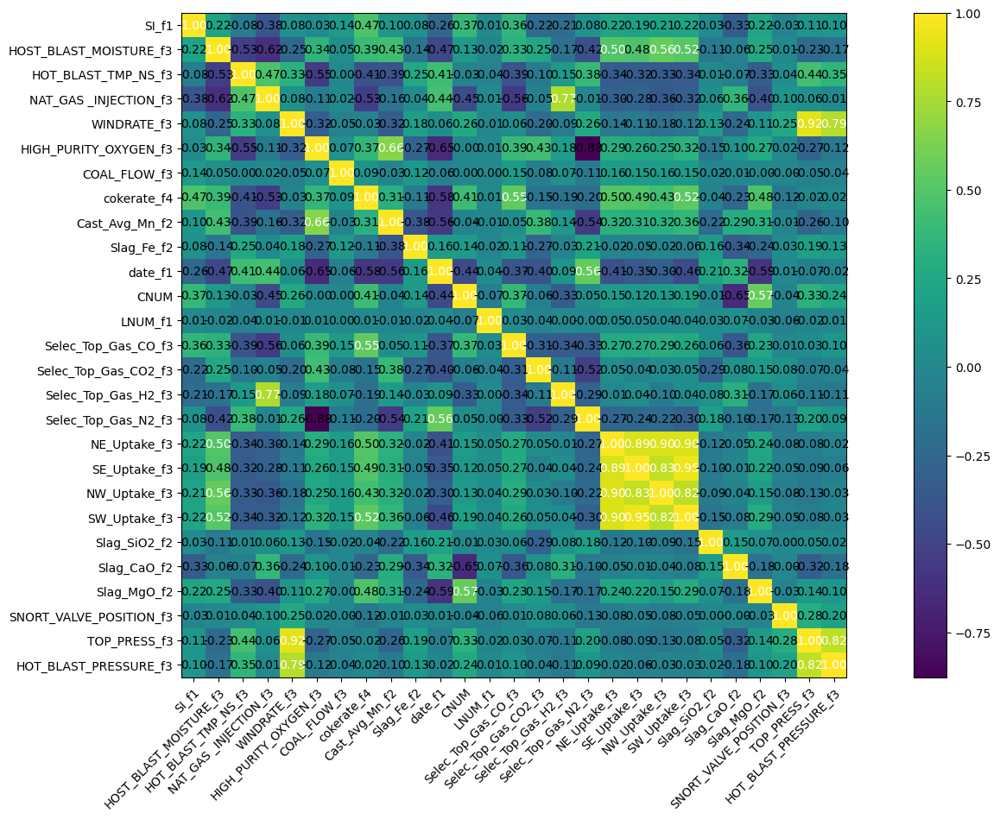

In [75]:

hm = heatmap(cm, row_names= headers_list, column_names=headers_list, figsize=[20,10])
plt.show()


array([<Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >], dtype=object)

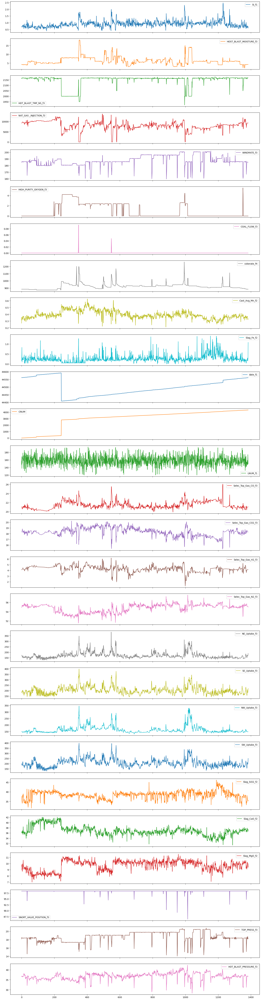

In [76]:

df_res.plot( figsize=(20,80),  subplots=True   )


In [77]:

df_res.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1384 entries, 0 to 1383
Data columns (total 27 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   SI_f1                    1384 non-null   float64
 1   HOST_BLAST_MOISTURE_f3   1384 non-null   float64
 2   HOT_BLAST_TMP_NS_f3      1384 non-null   float64
 3   NAT_GAS _INJECTION_f3    1384 non-null   float64
 4   WINDRATE_f3              1384 non-null   float64
 5   HIGH_PURITY_OXYGEN_f3    1384 non-null   float64
 6   COAL_FLOW_f3             1384 non-null   float64
 7   cokerate_f4              1384 non-null   float64
 8   Cast_Avg_Mn_f2           1384 non-null   float64
 9   Slag_Fe_f2               1384 non-null   float64
 10  date_f1                  1384 non-null   float64
 11  CNUM                     1384 non-null   float64
 12  LNUM_f1                  1384 non-null   float64
 13  Selec_Top_Gas_CO_f3      1384 non-null   float64
 14  Selec_Top_Gas_CO2_f3    

In [78]:

df_res


,SI_f1,HOST_BLAST_MOISTURE_f3,HOT_BLAST_TMP_NS_f3,NAT_GAS _INJECTION_f3,WINDRATE_f3,HIGH_PURITY_OXYGEN_f3,COAL_FLOW_f3,cokerate_f4,Cast_Avg_Mn_f2,Slag_Fe_f2,date_f1,CNUM,LNUM_f1,Selec_Top_Gas_CO_f3,Selec_Top_Gas_CO2_f3,Selec_Top_Gas_H2_f3,Selec_Top_Gas_N2_f3,NE_Uptake_f3,SE_Uptake_f3,NW_Uptake_f3,SW_Uptake_f3,Slag_SiO2_f2,Slag_CaO_f2,Slag_MgO_f2,SNORT_VALVE_POSITION_f3,TOP_PRESS_f3,HOT_BLAST_PRESSURE_f3
0,0.727000,4.238330,2164.265436,9297.367071,184.782388,0.0,0.0,884.0,0.268,0.21,44562.0,1.0,148.000000,21.076015,18.312771,4.131039,54.929399,172.754360,185.794067,148.124001,198.489715,37.630001,36.450001,9.56,98.334297,18.163729,36.647061
1,0.719500,4.242439,2161.425209,9306.840913,184.818611,0.0,0.0,884.0,0.354,0.16,44562.0,2.0,168.666667,21.080431,18.313322,4.131228,54.940123,171.769513,182.533770,148.126483,192.512412,37.369999,36.439999,9.86,98.334297,18.532928,36.602600
2,0.710486,4.174343,2168.238915,9336.364456,185.993447,0.0,0.0,884.0,0.313,0.83,44562.0,6.0,137.450000,20.996415,18.311768,4.133911,55.072779,170.595469,183.725050,148.161842,192.366046,35.540001,35.970001,9.03,98.334297,18.397217,36.882963
3,0.666106,4.126144,2167.779119,9419.200115,185.828474,0.0,0.0,884.0,0.360,0.10,44562.0,7.0,156.684211,20.749627,18.341701,4.137632,55.375043,167.017421,195.812061,147.562523,198.423474,34.849998,36.590000,9.13,98.334297,18.393974,36.568884
4,0.675145,4.120736,2166.974740,9564.165802,185.924481,0.0,0.0,884.0,0.319,0.34,44562.0,8.0,150.869919,20.609259,18.644476,4.142824,55.341884,154.214917,188.028883,147.807509,179.116839,34.009998,35.900002,8.82,98.334297,18.370316,36.839147
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1379,0.762500,4.204430,2169.361647,9297.484543,185.046491,0.0,0.0,884.0,0.343,0.30,44561.0,4344.0,147.500000,21.039583,18.308225,4.129485,55.162782,167.619915,185.900341,148.103530,199.914193,35.900002,37.259998,10.04,98.334297,18.209401,36.727897
1380,0.646000,4.208539,2169.079601,9312.779010,185.053796,0.0,0.0,884.0,0.324,0.30,44561.0,4345.0,147.500000,21.043999,18.308776,4.129674,55.162767,164.706552,182.408576,148.106012,193.501805,35.900002,37.259998,10.04,98.334297,18.762846,36.949964
1381,0.654667,4.212648,2168.797556,9303.753420,185.007919,0.0,0.0,884.0,0.325,0.16,44561.0,4346.0,174.000000,21.048415,18.309327,4.129862,55.140373,166.903493,181.684648,148.108493,194.328694,35.580002,36.500000,9.30,98.334297,18.510120,36.877184
1382,0.591667,4.217784,2168.444999,9333.448101,184.942435,0.0,0.0,884.0,0.335,0.26,44561.0,4347.0,160.000000,21.053935,18.310016,4.130097,55.098014,175.524144,195.202191,148.111595,215.606202,35.130001,37.470001,10.01,98.334297,18.168884,36.681149


In [79]:

cols_to_use = ['SI_f1',
 'HOST_BLAST_MOISTURE_f3',
 'HOT_BLAST_TMP_NS_f3',
 'NAT_GAS _INJECTION_f3',
 'WINDRATE_f3',
 'HIGH_PURITY_OXYGEN_f3',
 'COAL_FLOW_f3',
 'Cast_Avg_Mn_f2',
 'Slag_Fe_f2',
 'CNUM',
 'Selec_Top_Gas_CO_f3',
 'Selec_Top_Gas_CO2_f3',
 'Selec_Top_Gas_H2_f3',
 'Selec_Top_Gas_N2_f3',
 'NE_Uptake_f3',
 'SE_Uptake_f3',
 'NW_Uptake_f3',
 'SW_Uptake_f3',
 'Slag_SiO2_f2',
 'Slag_CaO_f2',
 'Slag_MgO_f2',
 'SNORT_VALVE_POSITION_f3',
 'TOP_PRESS_f3',
 'HOT_BLAST_PRESSURE_f3']


In [80]:

df_res


,SI_f1,HOST_BLAST_MOISTURE_f3,HOT_BLAST_TMP_NS_f3,NAT_GAS _INJECTION_f3,WINDRATE_f3,HIGH_PURITY_OXYGEN_f3,COAL_FLOW_f3,cokerate_f4,Cast_Avg_Mn_f2,Slag_Fe_f2,date_f1,CNUM,LNUM_f1,Selec_Top_Gas_CO_f3,Selec_Top_Gas_CO2_f3,Selec_Top_Gas_H2_f3,Selec_Top_Gas_N2_f3,NE_Uptake_f3,SE_Uptake_f3,NW_Uptake_f3,SW_Uptake_f3,Slag_SiO2_f2,Slag_CaO_f2,Slag_MgO_f2,SNORT_VALVE_POSITION_f3,TOP_PRESS_f3,HOT_BLAST_PRESSURE_f3
0,0.727000,4.238330,2164.265436,9297.367071,184.782388,0.0,0.0,884.0,0.268,0.21,44562.0,1.0,148.000000,21.076015,18.312771,4.131039,54.929399,172.754360,185.794067,148.124001,198.489715,37.630001,36.450001,9.56,98.334297,18.163729,36.647061
1,0.719500,4.242439,2161.425209,9306.840913,184.818611,0.0,0.0,884.0,0.354,0.16,44562.0,2.0,168.666667,21.080431,18.313322,4.131228,54.940123,171.769513,182.533770,148.126483,192.512412,37.369999,36.439999,9.86,98.334297,18.532928,36.602600
2,0.710486,4.174343,2168.238915,9336.364456,185.993447,0.0,0.0,884.0,0.313,0.83,44562.0,6.0,137.450000,20.996415,18.311768,4.133911,55.072779,170.595469,183.725050,148.161842,192.366046,35.540001,35.970001,9.03,98.334297,18.397217,36.882963
3,0.666106,4.126144,2167.779119,9419.200115,185.828474,0.0,0.0,884.0,0.360,0.10,44562.0,7.0,156.684211,20.749627,18.341701,4.137632,55.375043,167.017421,195.812061,147.562523,198.423474,34.849998,36.590000,9.13,98.334297,18.393974,36.568884
4,0.675145,4.120736,2166.974740,9564.165802,185.924481,0.0,0.0,884.0,0.319,0.34,44562.0,8.0,150.869919,20.609259,18.644476,4.142824,55.341884,154.214917,188.028883,147.807509,179.116839,34.009998,35.900002,8.82,98.334297,18.370316,36.839147
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1379,0.762500,4.204430,2169.361647,9297.484543,185.046491,0.0,0.0,884.0,0.343,0.30,44561.0,4344.0,147.500000,21.039583,18.308225,4.129485,55.162782,167.619915,185.900341,148.103530,199.914193,35.900002,37.259998,10.04,98.334297,18.209401,36.727897
1380,0.646000,4.208539,2169.079601,9312.779010,185.053796,0.0,0.0,884.0,0.324,0.30,44561.0,4345.0,147.500000,21.043999,18.308776,4.129674,55.162767,164.706552,182.408576,148.106012,193.501805,35.900002,37.259998,10.04,98.334297,18.762846,36.949964
1381,0.654667,4.212648,2168.797556,9303.753420,185.007919,0.0,0.0,884.0,0.325,0.16,44561.0,4346.0,174.000000,21.048415,18.309327,4.129862,55.140373,166.903493,181.684648,148.108493,194.328694,35.580002,36.500000,9.30,98.334297,18.510120,36.877184
1382,0.591667,4.217784,2168.444999,9333.448101,184.942435,0.0,0.0,884.0,0.335,0.26,44561.0,4347.0,160.000000,21.053935,18.310016,4.130097,55.098014,175.524144,195.202191,148.111595,215.606202,35.130001,37.470001,10.01,98.334297,18.168884,36.681149


In [81]:

df_res = df_res[cols_to_use]
df_res


,SI_f1,HOST_BLAST_MOISTURE_f3,HOT_BLAST_TMP_NS_f3,NAT_GAS _INJECTION_f3,WINDRATE_f3,HIGH_PURITY_OXYGEN_f3,COAL_FLOW_f3,Cast_Avg_Mn_f2,Slag_Fe_f2,CNUM,Selec_Top_Gas_CO_f3,Selec_Top_Gas_CO2_f3,Selec_Top_Gas_H2_f3,Selec_Top_Gas_N2_f3,NE_Uptake_f3,SE_Uptake_f3,NW_Uptake_f3,SW_Uptake_f3,Slag_SiO2_f2,Slag_CaO_f2,Slag_MgO_f2,SNORT_VALVE_POSITION_f3,TOP_PRESS_f3,HOT_BLAST_PRESSURE_f3
0,0.727000,4.238330,2164.265436,9297.367071,184.782388,0.0,0.0,0.268,0.21,1.0,21.076015,18.312771,4.131039,54.929399,172.754360,185.794067,148.124001,198.489715,37.630001,36.450001,9.56,98.334297,18.163729,36.647061
1,0.719500,4.242439,2161.425209,9306.840913,184.818611,0.0,0.0,0.354,0.16,2.0,21.080431,18.313322,4.131228,54.940123,171.769513,182.533770,148.126483,192.512412,37.369999,36.439999,9.86,98.334297,18.532928,36.602600
2,0.710486,4.174343,2168.238915,9336.364456,185.993447,0.0,0.0,0.313,0.83,6.0,20.996415,18.311768,4.133911,55.072779,170.595469,183.725050,148.161842,192.366046,35.540001,35.970001,9.03,98.334297,18.397217,36.882963
3,0.666106,4.126144,2167.779119,9419.200115,185.828474,0.0,0.0,0.360,0.10,7.0,20.749627,18.341701,4.137632,55.375043,167.017421,195.812061,147.562523,198.423474,34.849998,36.590000,9.13,98.334297,18.393974,36.568884
4,0.675145,4.120736,2166.974740,9564.165802,185.924481,0.0,0.0,0.319,0.34,8.0,20.609259,18.644476,4.142824,55.341884,154.214917,188.028883,147.807509,179.116839,34.009998,35.900002,8.82,98.334297,18.370316,36.839147
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1379,0.762500,4.204430,2169.361647,9297.484543,185.046491,0.0,0.0,0.343,0.30,4344.0,21.039583,18.308225,4.129485,55.162782,167.619915,185.900341,148.103530,199.914193,35.900002,37.259998,10.04,98.334297,18.209401,36.727897
1380,0.646000,4.208539,2169.079601,9312.779010,185.053796,0.0,0.0,0.324,0.30,4345.0,21.043999,18.308776,4.129674,55.162767,164.706552,182.408576,148.106012,193.501805,35.900002,37.259998,10.04,98.334297,18.762846,36.949964
1381,0.654667,4.212648,2168.797556,9303.753420,185.007919,0.0,0.0,0.325,0.16,4346.0,21.048415,18.309327,4.129862,55.140373,166.903493,181.684648,148.108493,194.328694,35.580002,36.500000,9.30,98.334297,18.510120,36.877184
1382,0.591667,4.217784,2168.444999,9333.448101,184.942435,0.0,0.0,0.335,0.26,4347.0,21.053935,18.310016,4.130097,55.098014,175.524144,195.202191,148.111595,215.606202,35.130001,37.470001,10.01,98.334297,18.168884,36.681149



## Coke Rate


In [82]:

x_coke_6_df = res['cokerate_f4']
x_coke_6_df.shape 


(1385,)

In [83]:

x_coke_6_df


0       884.0
1       884.0
2       884.0
3       884.0
4       884.0
        ...  
1380    884.0
1381    884.0
1382    884.0
1383    884.0
1384    884.0
Name: cokerate_f4, Length: 1385, dtype: float64

In [84]:

x_coke_6_hour = x_coke_6_df.iloc[ : -2 ].values
x_coke_6_hour.shape


(1383,)

In [85]:

si_and_1_cast_x = df_res.iloc[ 1: , :  ].values
si_and_1_cast_x.shape


(1383, 24)

In [86]:

cols_rotation_DF = df_res.columns.values.tolist()
cols_rotation_DF


['SI_f1',
 'HOST_BLAST_MOISTURE_f3',
 'HOT_BLAST_TMP_NS_f3',
 'NAT_GAS _INJECTION_f3',
 'WINDRATE_f3',
 'HIGH_PURITY_OXYGEN_f3',
 'COAL_FLOW_f3',
 'Cast_Avg_Mn_f2',
 'Slag_Fe_f2',
 'CNUM',
 'Selec_Top_Gas_CO_f3',
 'Selec_Top_Gas_CO2_f3',
 'Selec_Top_Gas_H2_f3',
 'Selec_Top_Gas_N2_f3',
 'NE_Uptake_f3',
 'SE_Uptake_f3',
 'NW_Uptake_f3',
 'SW_Uptake_f3',
 'Slag_SiO2_f2',
 'Slag_CaO_f2',
 'Slag_MgO_f2',
 'SNORT_VALVE_POSITION_f3',
 'TOP_PRESS_f3',
 'HOT_BLAST_PRESSURE_f3']

In [87]:

idx = df_res.index[ 1: ]
print(idx)


RangeIndex(start=1, stop=1384, step=1)


In [88]:

df_si_x    = pd.DataFrame(si_and_1_cast_x,  columns=cols_rotation_DF,         index=idx)
df_x_coke  = pd.DataFrame(x_coke_6_hour   , columns=['cokerate_f4'],         index=idx)


In [89]:

print(df_x_coke.shape)
print(df_si_x.shape)


(1383, 1)
(1383, 24)


In [90]:

df_res_shifted = pd.concat( [ df_si_x, df_x_coke], axis=1 )     
print(df_res_shifted.shape)


(1383, 25)


In [91]:

df_res_shifted


,SI_f1,HOST_BLAST_MOISTURE_f3,HOT_BLAST_TMP_NS_f3,NAT_GAS _INJECTION_f3,WINDRATE_f3,HIGH_PURITY_OXYGEN_f3,COAL_FLOW_f3,Cast_Avg_Mn_f2,Slag_Fe_f2,CNUM,Selec_Top_Gas_CO_f3,Selec_Top_Gas_CO2_f3,Selec_Top_Gas_H2_f3,Selec_Top_Gas_N2_f3,NE_Uptake_f3,SE_Uptake_f3,NW_Uptake_f3,SW_Uptake_f3,Slag_SiO2_f2,Slag_CaO_f2,Slag_MgO_f2,SNORT_VALVE_POSITION_f3,TOP_PRESS_f3,HOT_BLAST_PRESSURE_f3,cokerate_f4
1,0.719500,4.242439,2161.425209,9306.840913,184.818611,0.0,0.0,0.354,0.16,2.0,21.080431,18.313322,4.131228,54.940123,171.769513,182.533770,148.126483,192.512412,37.369999,36.439999,9.86,98.334297,18.532928,36.602600,884.0
2,0.710486,4.174343,2168.238915,9336.364456,185.993447,0.0,0.0,0.313,0.83,6.0,20.996415,18.311768,4.133911,55.072779,170.595469,183.725050,148.161842,192.366046,35.540001,35.970001,9.03,98.334297,18.397217,36.882963,884.0
3,0.666106,4.126144,2167.779119,9419.200115,185.828474,0.0,0.0,0.360,0.10,7.0,20.749627,18.341701,4.137632,55.375043,167.017421,195.812061,147.562523,198.423474,34.849998,36.590000,9.13,98.334297,18.393974,36.568884,884.0
4,0.675145,4.120736,2166.974740,9564.165802,185.924481,0.0,0.0,0.319,0.34,8.0,20.609259,18.644476,4.142824,55.341884,154.214917,188.028883,147.807509,179.116839,34.009998,35.900002,8.82,98.334297,18.370316,36.839147,884.0
5,0.776831,4.120331,2166.384674,9648.247637,185.942943,0.0,0.0,0.335,0.28,9.0,20.617383,18.845791,4.220690,55.284451,156.234542,200.141261,149.014319,186.052137,34.380001,35.970001,8.73,98.334297,18.395860,36.658018,884.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1379,0.762500,4.204430,2169.361647,9297.484543,185.046491,0.0,0.0,0.343,0.30,4344.0,21.039583,18.308225,4.129485,55.162782,167.619915,185.900341,148.103530,199.914193,35.900002,37.259998,10.04,98.334297,18.209401,36.727897,884.0
1380,0.646000,4.208539,2169.079601,9312.779010,185.053796,0.0,0.0,0.324,0.30,4345.0,21.043999,18.308776,4.129674,55.162767,164.706552,182.408576,148.106012,193.501805,35.900002,37.259998,10.04,98.334297,18.762846,36.949964,884.0
1381,0.654667,4.212648,2168.797556,9303.753420,185.007919,0.0,0.0,0.325,0.16,4346.0,21.048415,18.309327,4.129862,55.140373,166.903493,181.684648,148.108493,194.328694,35.580002,36.500000,9.30,98.334297,18.510120,36.877184,884.0
1382,0.591667,4.217784,2168.444999,9333.448101,184.942435,0.0,0.0,0.335,0.26,4347.0,21.053935,18.310016,4.130097,55.098014,175.524144,195.202191,148.111595,215.606202,35.130001,37.470001,10.01,98.334297,18.168884,36.681149,884.0



## Correlation Matrix


In [92]:

headers_list = df_res_shifted.columns.values.tolist()
headers_list


['SI_f1',
 'HOST_BLAST_MOISTURE_f3',
 'HOT_BLAST_TMP_NS_f3',
 'NAT_GAS _INJECTION_f3',
 'WINDRATE_f3',
 'HIGH_PURITY_OXYGEN_f3',
 'COAL_FLOW_f3',
 'Cast_Avg_Mn_f2',
 'Slag_Fe_f2',
 'CNUM',
 'Selec_Top_Gas_CO_f3',
 'Selec_Top_Gas_CO2_f3',
 'Selec_Top_Gas_H2_f3',
 'Selec_Top_Gas_N2_f3',
 'NE_Uptake_f3',
 'SE_Uptake_f3',
 'NW_Uptake_f3',
 'SW_Uptake_f3',
 'Slag_SiO2_f2',
 'Slag_CaO_f2',
 'Slag_MgO_f2',
 'SNORT_VALVE_POSITION_f3',
 'TOP_PRESS_f3',
 'HOT_BLAST_PRESSURE_f3',
 'cokerate_f4']

In [93]:

cm = np.corrcoef( df_res_shifted[ headers_list ].values.T  )


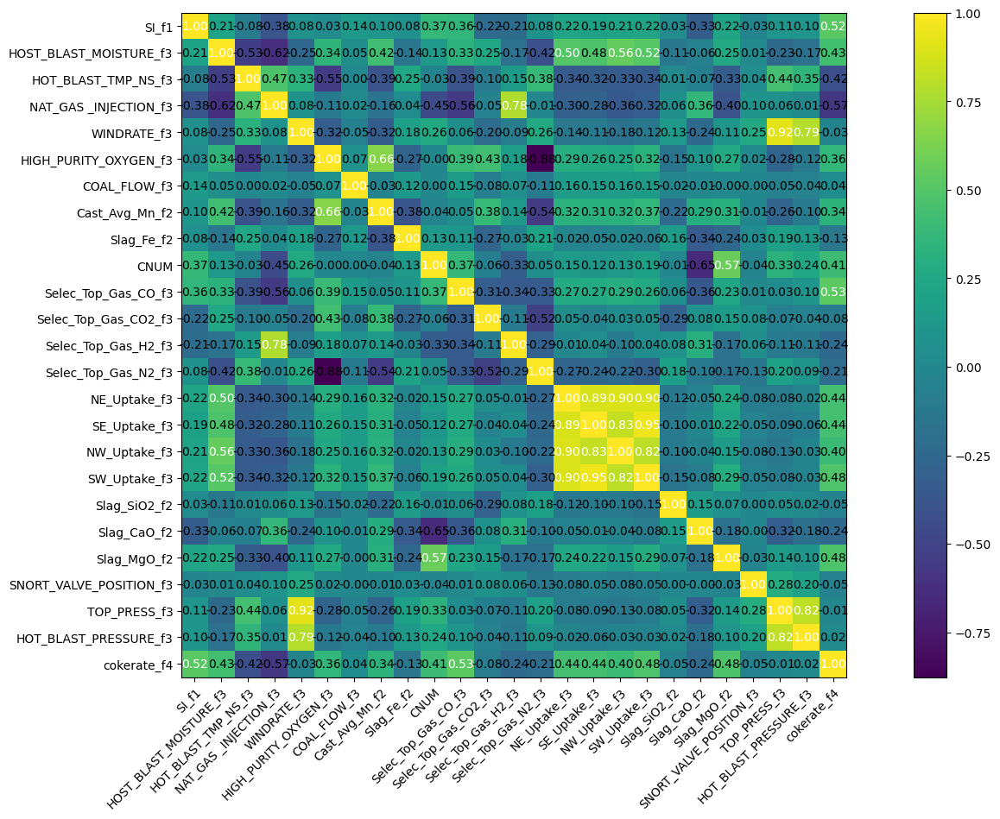

In [94]:

hm = heatmap(cm, row_names= headers_list, column_names=headers_list, figsize=[20,10])
plt.show()


array([<Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >,
       <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >, <Axes: >],
      dtype=object)

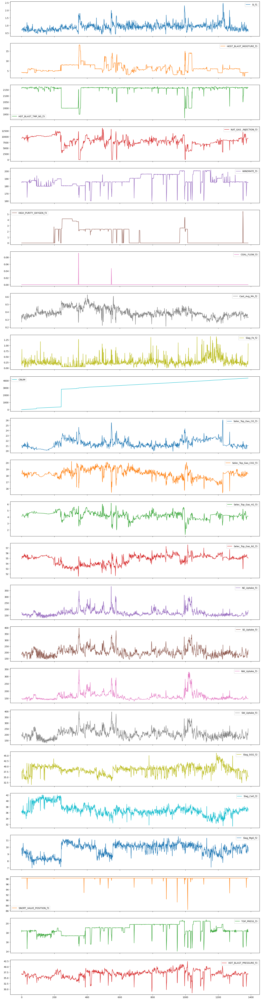

In [95]:

df_res.plot( figsize=(20,80),  subplots=True   )



## Add date to dataset


In [97]:

dict_map_cnum_dates 


{2809: '2021-08-01 01:23:00',
 2810: '2021-08-01 03:30:00',
 2811: '2021-08-01 06:39:00',
 2812: '2021-08-01 08:50:00',
 2813: '2021-08-01 11:38:00',
 2814: '2021-08-01 13:48:00',
 2815: '2021-08-01 16:55:00',
 2816: '2021-08-01 18:50:00',
 2817: '2021-08-01 21:56:00',
 2818: '2021-08-01 00:38:00',
 2819: '2021-08-02 02:18:00',
 2820: '2021-08-02 04:41:00',
 2821: '2021-08-02 06:45:00',
 2823: '2021-08-02 08:56:00',
 2824: '2021-08-02 10:42:00',
 2825: '2021-08-02 13:30:00',
 2826: '2021-08-02 14:30:00',
 2827: '2021-08-02 15:58:00',
 2828: '2021-08-02 18:25:00',
 2829: '2021-08-02 20:33:00',
 2830: '2021-08-02 00:08:00',
 2831: '2021-08-03 01:54:00',
 2832: '2021-08-03 04:11:00',
 2833: '2021-08-03 06:57:00',
 2834: '2021-08-03 09:15:00',
 2835: '2021-08-03 10:15:00',
 2836: '2021-08-03 13:15:00',
 2837: '2021-08-03 14:15:00',
 2838: '2021-08-03 16:50:00',
 2839: '2021-08-03 05:57:00',
 2840: '2021-08-03 19:26:00',
 2841: '2021-08-03 20:11:00',
 2842: '2021-08-03 21:51:00',
 2843: '20

In [98]:

df_res_shifted


,SI_f1,HOST_BLAST_MOISTURE_f3,HOT_BLAST_TMP_NS_f3,NAT_GAS _INJECTION_f3,WINDRATE_f3,HIGH_PURITY_OXYGEN_f3,COAL_FLOW_f3,Cast_Avg_Mn_f2,Slag_Fe_f2,CNUM,Selec_Top_Gas_CO_f3,Selec_Top_Gas_CO2_f3,Selec_Top_Gas_H2_f3,Selec_Top_Gas_N2_f3,NE_Uptake_f3,SE_Uptake_f3,NW_Uptake_f3,SW_Uptake_f3,Slag_SiO2_f2,Slag_CaO_f2,Slag_MgO_f2,SNORT_VALVE_POSITION_f3,TOP_PRESS_f3,HOT_BLAST_PRESSURE_f3,cokerate_f4
1,0.719500,4.242439,2161.425209,9306.840913,184.818611,0.0,0.0,0.354,0.16,2.0,21.080431,18.313322,4.131228,54.940123,171.769513,182.533770,148.126483,192.512412,37.369999,36.439999,9.86,98.334297,18.532928,36.602600,884.0
2,0.710486,4.174343,2168.238915,9336.364456,185.993447,0.0,0.0,0.313,0.83,6.0,20.996415,18.311768,4.133911,55.072779,170.595469,183.725050,148.161842,192.366046,35.540001,35.970001,9.03,98.334297,18.397217,36.882963,884.0
3,0.666106,4.126144,2167.779119,9419.200115,185.828474,0.0,0.0,0.360,0.10,7.0,20.749627,18.341701,4.137632,55.375043,167.017421,195.812061,147.562523,198.423474,34.849998,36.590000,9.13,98.334297,18.393974,36.568884,884.0
4,0.675145,4.120736,2166.974740,9564.165802,185.924481,0.0,0.0,0.319,0.34,8.0,20.609259,18.644476,4.142824,55.341884,154.214917,188.028883,147.807509,179.116839,34.009998,35.900002,8.82,98.334297,18.370316,36.839147,884.0
5,0.776831,4.120331,2166.384674,9648.247637,185.942943,0.0,0.0,0.335,0.28,9.0,20.617383,18.845791,4.220690,55.284451,156.234542,200.141261,149.014319,186.052137,34.380001,35.970001,8.73,98.334297,18.395860,36.658018,884.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1379,0.762500,4.204430,2169.361647,9297.484543,185.046491,0.0,0.0,0.343,0.30,4344.0,21.039583,18.308225,4.129485,55.162782,167.619915,185.900341,148.103530,199.914193,35.900002,37.259998,10.04,98.334297,18.209401,36.727897,884.0
1380,0.646000,4.208539,2169.079601,9312.779010,185.053796,0.0,0.0,0.324,0.30,4345.0,21.043999,18.308776,4.129674,55.162767,164.706552,182.408576,148.106012,193.501805,35.900002,37.259998,10.04,98.334297,18.762846,36.949964,884.0
1381,0.654667,4.212648,2168.797556,9303.753420,185.007919,0.0,0.0,0.325,0.16,4346.0,21.048415,18.309327,4.129862,55.140373,166.903493,181.684648,148.108493,194.328694,35.580002,36.500000,9.30,98.334297,18.510120,36.877184,884.0
1382,0.591667,4.217784,2168.444999,9333.448101,184.942435,0.0,0.0,0.335,0.26,4347.0,21.053935,18.310016,4.130097,55.098014,175.524144,195.202191,148.111595,215.606202,35.130001,37.470001,10.01,98.334297,18.168884,36.681149,884.0


In [99]:

df_res_shifted.insert(1, 'Date_Map', 'abc')
df_res_shifted


,SI_f1,Date_Map,HOST_BLAST_MOISTURE_f3,HOT_BLAST_TMP_NS_f3,NAT_GAS _INJECTION_f3,WINDRATE_f3,HIGH_PURITY_OXYGEN_f3,COAL_FLOW_f3,Cast_Avg_Mn_f2,Slag_Fe_f2,CNUM,Selec_Top_Gas_CO_f3,Selec_Top_Gas_CO2_f3,Selec_Top_Gas_H2_f3,Selec_Top_Gas_N2_f3,NE_Uptake_f3,SE_Uptake_f3,NW_Uptake_f3,SW_Uptake_f3,Slag_SiO2_f2,Slag_CaO_f2,Slag_MgO_f2,SNORT_VALVE_POSITION_f3,TOP_PRESS_f3,HOT_BLAST_PRESSURE_f3,cokerate_f4
1,0.719500,abc,4.242439,2161.425209,9306.840913,184.818611,0.0,0.0,0.354,0.16,2.0,21.080431,18.313322,4.131228,54.940123,171.769513,182.533770,148.126483,192.512412,37.369999,36.439999,9.86,98.334297,18.532928,36.602600,884.0
2,0.710486,abc,4.174343,2168.238915,9336.364456,185.993447,0.0,0.0,0.313,0.83,6.0,20.996415,18.311768,4.133911,55.072779,170.595469,183.725050,148.161842,192.366046,35.540001,35.970001,9.03,98.334297,18.397217,36.882963,884.0
3,0.666106,abc,4.126144,2167.779119,9419.200115,185.828474,0.0,0.0,0.360,0.10,7.0,20.749627,18.341701,4.137632,55.375043,167.017421,195.812061,147.562523,198.423474,34.849998,36.590000,9.13,98.334297,18.393974,36.568884,884.0
4,0.675145,abc,4.120736,2166.974740,9564.165802,185.924481,0.0,0.0,0.319,0.34,8.0,20.609259,18.644476,4.142824,55.341884,154.214917,188.028883,147.807509,179.116839,34.009998,35.900002,8.82,98.334297,18.370316,36.839147,884.0
5,0.776831,abc,4.120331,2166.384674,9648.247637,185.942943,0.0,0.0,0.335,0.28,9.0,20.617383,18.845791,4.220690,55.284451,156.234542,200.141261,149.014319,186.052137,34.380001,35.970001,8.73,98.334297,18.395860,36.658018,884.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1379,0.762500,abc,4.204430,2169.361647,9297.484543,185.046491,0.0,0.0,0.343,0.30,4344.0,21.039583,18.308225,4.129485,55.162782,167.619915,185.900341,148.103530,199.914193,35.900002,37.259998,10.04,98.334297,18.209401,36.727897,884.0
1380,0.646000,abc,4.208539,2169.079601,9312.779010,185.053796,0.0,0.0,0.324,0.30,4345.0,21.043999,18.308776,4.129674,55.162767,164.706552,182.408576,148.106012,193.501805,35.900002,37.259998,10.04,98.334297,18.762846,36.949964,884.0
1381,0.654667,abc,4.212648,2168.797556,9303.753420,185.007919,0.0,0.0,0.325,0.16,4346.0,21.048415,18.309327,4.129862,55.140373,166.903493,181.684648,148.108493,194.328694,35.580002,36.500000,9.30,98.334297,18.510120,36.877184,884.0
1382,0.591667,abc,4.217784,2168.444999,9333.448101,184.942435,0.0,0.0,0.335,0.26,4347.0,21.053935,18.310016,4.130097,55.098014,175.524144,195.202191,148.111595,215.606202,35.130001,37.470001,10.01,98.334297,18.168884,36.681149,884.0


In [100]:

## dict_map_cnum_dates 

for index, row in df_res_shifted.iterrows():
    
    the_cnum = df_res_shifted.at[index, 'CNUM']
    if dict_map_cnum_dates[ the_cnum ]: 
        df_res_shifted.at[index, 'Date_Map'] = dict_map_cnum_dates[the_cnum ]


In [101]:

df_res_shifted


,SI_f1,Date_Map,HOST_BLAST_MOISTURE_f3,HOT_BLAST_TMP_NS_f3,NAT_GAS _INJECTION_f3,WINDRATE_f3,HIGH_PURITY_OXYGEN_f3,COAL_FLOW_f3,Cast_Avg_Mn_f2,Slag_Fe_f2,CNUM,Selec_Top_Gas_CO_f3,Selec_Top_Gas_CO2_f3,Selec_Top_Gas_H2_f3,Selec_Top_Gas_N2_f3,NE_Uptake_f3,SE_Uptake_f3,NW_Uptake_f3,SW_Uptake_f3,Slag_SiO2_f2,Slag_CaO_f2,Slag_MgO_f2,SNORT_VALVE_POSITION_f3,TOP_PRESS_f3,HOT_BLAST_PRESSURE_f3,cokerate_f4
1,0.719500,2022-01-01 00:45:00,4.242439,2161.425209,9306.840913,184.818611,0.0,0.0,0.354,0.16,2.0,21.080431,18.313322,4.131228,54.940123,171.769513,182.533770,148.126483,192.512412,37.369999,36.439999,9.86,98.334297,18.532928,36.602600,884.0
2,0.710486,2022-01-01 08:43:00,4.174343,2168.238915,9336.364456,185.993447,0.0,0.0,0.313,0.83,6.0,20.996415,18.311768,4.133911,55.072779,170.595469,183.725050,148.161842,192.366046,35.540001,35.970001,9.03,98.334297,18.397217,36.882963,884.0
3,0.666106,2022-01-01 10:17:00,4.126144,2167.779119,9419.200115,185.828474,0.0,0.0,0.360,0.10,7.0,20.749627,18.341701,4.137632,55.375043,167.017421,195.812061,147.562523,198.423474,34.849998,36.590000,9.13,98.334297,18.393974,36.568884,884.0
4,0.675145,2022-01-01 12:40:00,4.120736,2166.974740,9564.165802,185.924481,0.0,0.0,0.319,0.34,8.0,20.609259,18.644476,4.142824,55.341884,154.214917,188.028883,147.807509,179.116839,34.009998,35.900002,8.82,98.334297,18.370316,36.839147,884.0
5,0.776831,2022-01-01 15:06:00,4.120331,2166.384674,9648.247637,185.942943,0.0,0.0,0.335,0.28,9.0,20.617383,18.845791,4.220690,55.284451,156.234542,200.141261,149.014319,186.052137,34.380001,35.970001,8.73,98.334297,18.395860,36.658018,884.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1379,0.762500,2021-12-31 13:10:00,4.204430,2169.361647,9297.484543,185.046491,0.0,0.0,0.343,0.30,4344.0,21.039583,18.308225,4.129485,55.162782,167.619915,185.900341,148.103530,199.914193,35.900002,37.259998,10.04,98.334297,18.209401,36.727897,884.0
1380,0.646000,2021-12-31 14:41:00,4.208539,2169.079601,9312.779010,185.053796,0.0,0.0,0.324,0.30,4345.0,21.043999,18.308776,4.129674,55.162767,164.706552,182.408576,148.106012,193.501805,35.900002,37.259998,10.04,98.334297,18.762846,36.949964,884.0
1381,0.654667,2021-12-31 16:15:00,4.212648,2168.797556,9303.753420,185.007919,0.0,0.0,0.325,0.16,4346.0,21.048415,18.309327,4.129862,55.140373,166.903493,181.684648,148.108493,194.328694,35.580002,36.500000,9.30,98.334297,18.510120,36.877184,884.0
1382,0.591667,2021-12-31 17:40:00,4.217784,2168.444999,9333.448101,184.942435,0.0,0.0,0.335,0.26,4347.0,21.053935,18.310016,4.130097,55.098014,175.524144,195.202191,148.111595,215.606202,35.130001,37.470001,10.01,98.334297,18.168884,36.681149,884.0



## Save File


In [102]:

df_res_shifted.to_csv('output/RC_CNUM_RNN_time_DELAYS_2000_PerCast_rcalix.csv')
